# Classification sur l'attribut outcome

### Fixer la valeur du seed 

In [1]:
seed = 7

## 0) L'étude du dataset

L'ensemble de données contient 368 instances. En effet, celles-ci sont séparées en deux ensembles, soit 300 données d'entraînement et 68 données de test. Au total, il y a 28 attributs différents qui peuvent être des valeurs continues, discrètes ou nominales. Cet ensemble de données date de l'année 1989. Il est souvent utilisé pour des tâches de classification. L'objectif est de prédire ce qui arrivera au cheval, soit son outcome. En effet l'attribut 23 correspond à cette valeur et peut soit être 1,2 ou 3. La valeur 1 est pour indiquer que le cheval survit, 2 si le cheval est décédé et 3 si celui-ci a été euthanasié. Il est aussi possible d'utiliser l'attribut 24 pour le problème de classification. Il s'agit d'un attribut booléen indiquant si le problème (lésion) du cheval était chirurgical. Une des particularités de cet ensemble de données est sa quantité de valeurs manquantes. En effet, environ 20% des valeurs sont manquantes ce qui offre un défi pour les personnes souhaitant effectuer des expériences avec.

Les attributs présents consistent plusieurs informations qui pourraient nous aider à classifier les données. Les attributs sont surgery qui représente un booléen indiquant si le cheval a déjà reçu une chirurgie, l'âge du cheval, le numéro de l'hôpital où le cheval a été traité, la température rectale, la fréquence respiratoire, plusieurs informations subjectives telles que la douleur du cheval et des attributs sur des conditions médicales des organes du cheval.

## 1) Téléchargement du dataset

In [2]:
import pandas as pd
import numpy as np 
import wget 
import os

directory = "./data"
# Créer le répertoire seulement s'il n'existe pas déjà
try:
    os.makedirs(directory)
except FileExistsError:
    # directory already exists
    pass

url_train = 'http://archive.ics.uci.edu/ml/machine-learning-databases/horse-colic/horse-colic.data'
url_test =  'http://archive.ics.uci.edu/ml/machine-learning-databases/horse-colic/horse-colic.test'

path_to_train = "./data/horse-colic.data"
path_to_test = "./data/horse-colic.test"

if not os.path.exists(path_to_train) and not os.path.exists(path_to_test) :
    wget.download(url_train, path_to_train)
    wget.download(url_test, path_to_test)
else:
    print("Les données d'entrainement et celles de test ont déjà été téléchargées")



Les données d'entrainement et celles de test ont déjà été téléchargées


## 2) Exploration des données

In [3]:
variable_names = ["surgery", "age", "hospital_number",
    "rectal_temperature", "pulse",
    "respiratory_rate", "temperature_extremities",
    "peripheral_pulse", "mucous_membranes",
    "capillary_refill_time", "pain",
    "peristalsis", "abdominal_distension",
    "nasogastric_tube", "nasogastric_reflux",
    "nasogastric_reflux_ph", "feces", "abdomen",
    "packed_cell_volume", "total_protein",
    "abdomcentesis_appearance", "abdomcentesis_total_protein",
    "outcome", "surgical_lesion", "lesion_1", "lesion_2", "lesion_3",
    "cp_data"]

# Remplacer toutes les valeurs manquantes par NaN avec le paramètre na_values
df_train = pd.read_csv(path_to_train, delim_whitespace=True, names=variable_names, na_values="?")
df_test= pd.read_csv(path_to_test, delim_whitespace=True, names=variable_names, na_values="?")


In [4]:
df_train

,surgery,age,hospital_number,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,...,packed_cell_volume,total_protein,abdomcentesis_appearance,abdomcentesis_total_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,2.0,1,530101,38.5,66.0,28.0,3.0,3.0,NaN,2.0,...,45.0,8.4,NaN,NaN,2.0,2,11300,0,0,2
1,1.0,1,534817,39.2,88.0,20.0,NaN,NaN,4.0,1.0,...,50.0,85.0,2.0,2.0,3.0,2,2208,0,0,2
2,2.0,1,530334,38.3,40.0,24.0,1.0,1.0,3.0,1.0,...,33.0,6.7,NaN,NaN,1.0,2,0,0,0,1
3,1.0,9,5290409,39.1,164.0,84.0,4.0,1.0,6.0,2.0,...,48.0,7.2,3.0,5.3,2.0,1,2208,0,0,1
4,2.0,1,530255,37.3,104.0,35.0,NaN,NaN,6.0,2.0,...,74.0,7.4,NaN,NaN,2.0,2,4300,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1,533886,NaN,120.0,70.0,4.0,NaN,4.0,2.0,...,55.0,65.0,NaN,NaN,3.0,2,3205,0,0,2
296,2.0,1,527702,37.2,72.0,24.0,3.0,2.0,4.0,2.0,...,44.0,NaN,3.0,3.3,3.0,1,2208,0,0,1
297,1.0,1,529386,37.5,72.0,30.0,4.0,3.0,4.0,1.0,...,60.0,6.8,NaN,NaN,2.0,1,3205,0,0,2
298,1.0,1,530612,36.5,100.0,24.0,3.0,3.0,3.0,1.0,...,50.0,6.0,3.0,3.4,1.0,1,2208,0,0,1


In [5]:
df_test

,surgery,age,hospital_number,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,...,packed_cell_volume,total_protein,abdomcentesis_appearance,abdomcentesis_total_protein,outcome,surgical_lesion,lesion_1,lesion_2,lesion_3,cp_data
0,2.0,1,528626,38.5,54.0,20.0,NaN,1.0,2.0,2.0,...,42.0,6.3,NaN,NaN,1.0,2,3111,0,0,1
1,2.0,1,527950,37.6,48.0,36.0,NaN,NaN,1.0,1.0,...,44.0,6.3,1.0,5.0,1.0,2,3111,0,0,1
2,1.0,1,535263,37.7,44.0,28.0,NaN,4.0,3.0,2.0,...,45.0,70.0,3.0,2.0,1.0,1,3205,0,0,2
3,1.0,1,534523,37.0,56.0,24.0,3.0,1.0,4.0,2.0,...,35.0,61.0,3.0,2.0,3.0,2,2205,2208,0,2
4,2.0,1,528926,38.0,42.0,12.0,3.0,NaN,3.0,1.0,...,37.0,5.8,NaN,NaN,1.0,2,3111,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,2.0,1,529695,38.6,60.0,30.0,1.0,1.0,3.0,1.0,...,40.0,6.0,1.0,NaN,1.0,1,3205,0,0,2
64,2.0,1,528452,37.8,42.0,40.0,1.0,1.0,1.0,1.0,...,36.0,6.2,NaN,NaN,1.0,2,4124,0,0,2
65,1.0,1,534783,38.0,60.0,12.0,1.0,1.0,2.0,1.0,...,44.0,65.0,3.0,2.0,3.0,1,2209,0,0,2
66,2.0,1,528926,38.0,42.0,12.0,3.0,NaN,3.0,1.0,...,37.0,5.8,NaN,NaN,1.0,2,3111,0,0,2


In [6]:
from pandas_profiling import ProfileReport


profile_report = ProfileReport(df_train) 
profile_report.to_file(output_file='./data/output_pandas_profiling.html')

In [7]:
profile_report

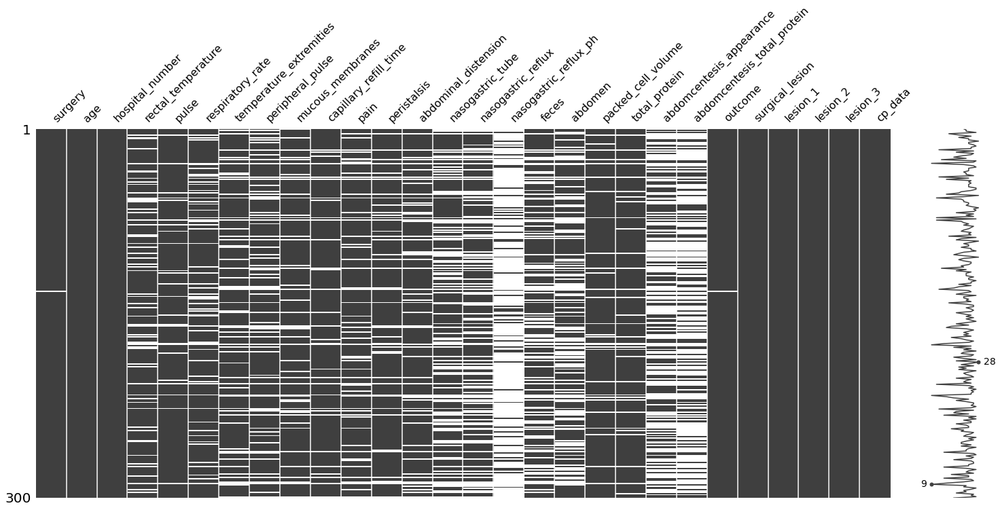

In [8]:
import missingno as mno
fig = mno.matrix(df_train)
fig_copy = fig.get_figure()
fig_copy.savefig('./data/matrix_missing_plot.png', bbox_inches = 'tight')

Dans ce graphique, nous pouvons voir que la la grande majorite des attributs possedent beaucoup de valeurs manquantes. Les espaces blancs representent les donnees manquantes. Certains attributs ne possedent aucune valeur manquante tellque que l'age.

In [9]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   surgery                      299 non-null    float64
 1   age                          300 non-null    int64  
 2   hospital_number              300 non-null    int64  
 3   rectal_temperature           240 non-null    float64
 4   pulse                        276 non-null    float64
 5   respiratory_rate             242 non-null    float64
 6   temperature_extremities      244 non-null    float64
 7   peripheral_pulse             231 non-null    float64
 8   mucous_membranes             253 non-null    float64
 9   capillary_refill_time        268 non-null    float64
 10  pain                         245 non-null    float64
 11  peristalsis                  256 non-null    float64
 12  abdominal_distension         244 non-null    float64
 13  nasogastric_tube    

En observant toutes les représentations graphiques que je viens de faire, nous pouvons voir qu'une énorme quantité de données sont manquantes. Effectivement le ProfileReport nous montre pour chaque attribut, la quantité de données manquantes. En effet, plusieurs valeurs possèdent un avertissement indiquant qu'elles possèdent des valeurs manquantes. Il s'agit de 19 features, ce qui représente la majorité de nos attributs dans l'ensemble de données. L'attribut nasogastric_reflux_ph possède 247 (82.3%) valeurs manquantes, les attributs surgery et outcome possèdent une valeur manquante chaque, mais ne sont pas affichés dans les avertissements. Le profile report nous permet aussi de voir la répartition des valeurs pour chaque attribut ce qui est intéressant. Nous pouvons voir aussi que la majorité des valeurs pour les attributs sont des nombres décimaux (21) et les autres sont des entiers (7).

## 3) La pertinence des caractéristiques 

En effectuant plusieurs recherches, j'ai trouvé l'article suivant: https://arxiv.org/pdf/1403.4540.pdf?fbclid=IwAR2WInl-dk62uxPxjTXseC2BuwTacxHSdCDQ7fm-LIn1ium-rZ8C2bj8dN8. Les auteurs indiquent que les attributs 3 et 28 ne fournissent pas d'information significative et peuvent par conséquent être ignorés. Il s'agit effectivement du numéro de l'hôpital et l'attribut 28 indique si les données pathologiques sont présentes ou pas. En effet, ces deux variables ont peu d'importance pour cette étude. Aussi pour l'attribut 28, dans l'ensemble de données, la note suivante est indiquée : this variable is of no significance since pathology data is not included or collected for these cases. Cela supporte la décision des auteurs de l'article en question. Les auteurs décident d'abandonner trois autres attributs, soit les attributs 25, 26 et 27. Puisque ces trois attributs représentent des informations alternatives et n'ajoutent aucune nouvelle information qui pourrait être utile à la classification.

In [10]:
columns_to_drop = ["hospital_number", "lesion_1", "lesion_2", "lesion_3", "cp_data"]
df_train_drop = df_train.drop(columns_to_drop, axis=1)
df_test_drop = df_test.drop(columns_to_drop, axis=1)
df_train_drop

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,...,nasogastric_reflux,nasogastric_reflux_ph,feces,abdomen,packed_cell_volume,total_protein,abdomcentesis_appearance,abdomcentesis_total_protein,outcome,surgical_lesion
0,2.0,1,38.5,66.0,28.0,3.0,3.0,NaN,2.0,5.0,...,NaN,NaN,3.0,5.0,45.0,8.4,NaN,NaN,2.0,2
1,1.0,1,39.2,88.0,20.0,NaN,NaN,4.0,1.0,3.0,...,NaN,NaN,4.0,2.0,50.0,85.0,2.0,2.0,3.0,2
2,2.0,1,38.3,40.0,24.0,1.0,1.0,3.0,1.0,3.0,...,NaN,NaN,1.0,1.0,33.0,6.7,NaN,NaN,1.0,2
3,1.0,9,39.1,164.0,84.0,4.0,1.0,6.0,2.0,2.0,...,2.0,5.0,3.0,NaN,48.0,7.2,3.0,5.3,2.0,1
4,2.0,1,37.3,104.0,35.0,NaN,NaN,6.0,2.0,NaN,...,NaN,NaN,NaN,NaN,74.0,7.4,NaN,NaN,2.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1,NaN,120.0,70.0,4.0,NaN,4.0,2.0,2.0,...,NaN,NaN,NaN,5.0,55.0,65.0,NaN,NaN,3.0,2
296,2.0,1,37.2,72.0,24.0,3.0,2.0,4.0,2.0,4.0,...,1.0,NaN,4.0,4.0,44.0,NaN,3.0,3.3,3.0,1
297,1.0,1,37.5,72.0,30.0,4.0,3.0,4.0,1.0,4.0,...,1.0,NaN,3.0,5.0,60.0,6.8,NaN,NaN,2.0,1
298,1.0,1,36.5,100.0,24.0,3.0,3.0,3.0,1.0,3.0,...,1.0,NaN,4.0,4.0,50.0,6.0,3.0,3.4,1.0,1


### Beaucoup de valeurs missing

<AxesSubplot:>

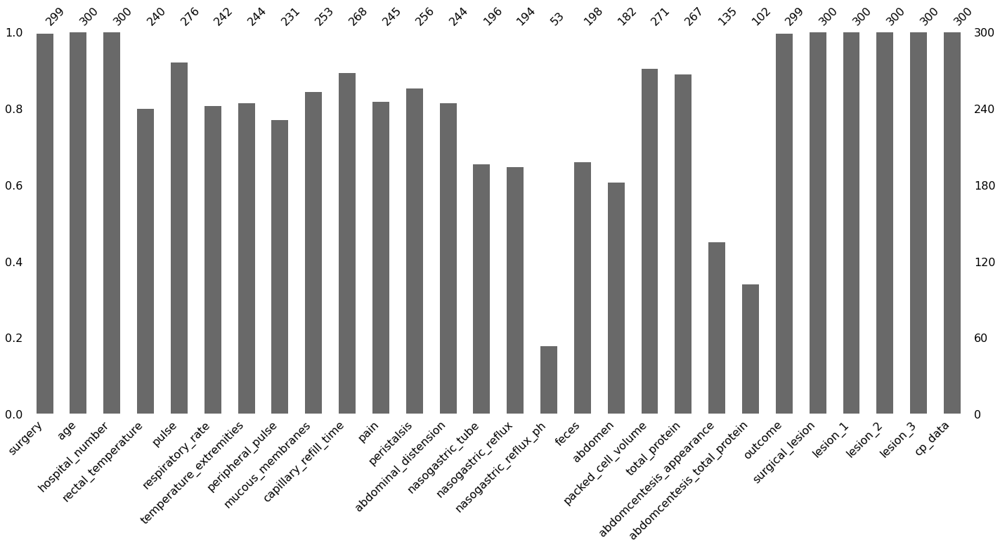

In [11]:
import missingno as msno 

msno.bar(df_train)

Voici une autre representation graphique des donnees pour voir la quantie de donnees manquantes. Il est interessant de voir la variable nasogastric_reflux_ph contient uniquement 53 valeurs sur 300. Quand une enorme partie des donnees sont manquantes, je trouve qu'il faudrait laisser tomber la colonne. 

Text(0.5, 1.0, 'Variables')

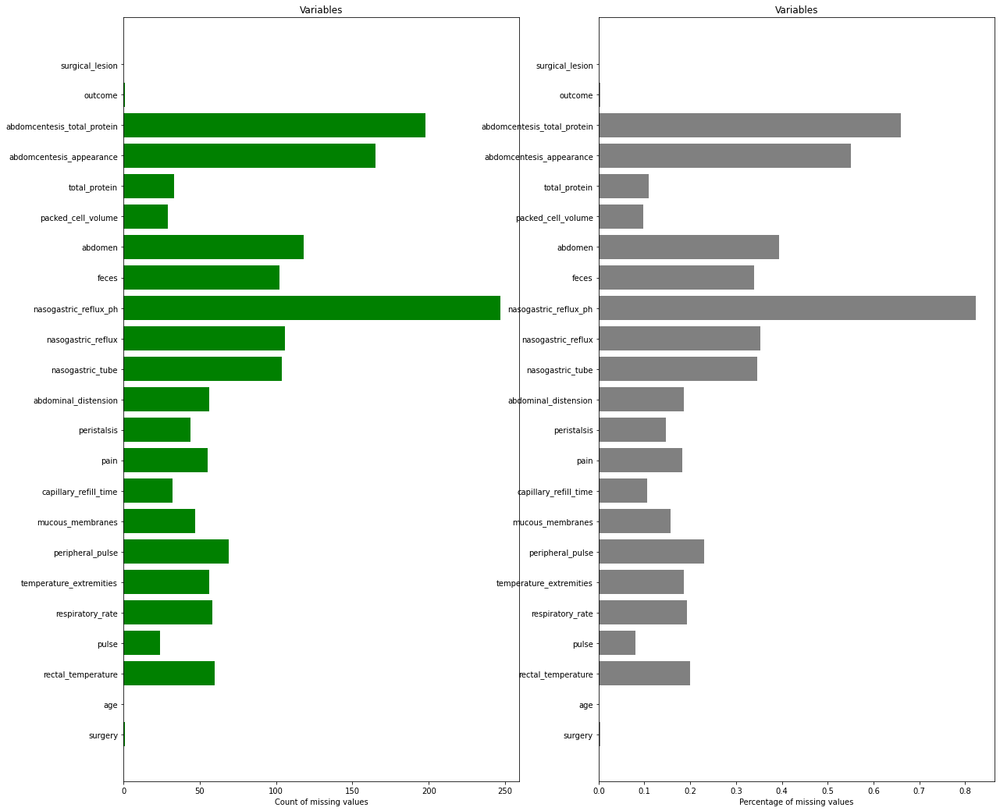

In [12]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Contient la liste des noms de variables 
variable_names = [] 

# Contient le nombre de données manquantes 
missing_count = [] 

# Contient les pourcentages de données manquantes
percent_missing = [] 

for col in df_train_drop.columns:
    variable_names.append(col)
    missing_count.append(df_train_drop[col].isnull().sum())
    percent_missing.append(df_train_drop[col].isnull().sum()/df_train_drop.shape[0])

ind = np.arange(len(variable_names))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 18))

rects = ax1.barh(ind, np.array(missing_count), color='green')
ax1.set_yticks(ind)
ax1.set_yticklabels(variable_names, rotation='horizontal')
ax1.set_xlabel("Count of missing values")
ax1.set_title("Variables")

rects = ax2.barh(ind, np.array(percent_missing), color='gray')
ax2.set_yticks(ind)
ax2.set_yticklabels(variable_names, rotation='horizontal')
ax2.set_xlabel("Percentage of missing values")
ax2.set_title("Variables")

### En effectuant plusieurs recherches, j'ai décidé de retirer les colonnes avec 45% et plus des données manquantes

In [13]:
dropped_cols = []
for (percentage, col) in zip(percent_missing, df_train_drop.columns):
    if percentage >= 0.45:
        df_train_drop.drop(col, axis=1, inplace=True)
        df_test_drop.drop(col, axis=1, inplace=True)
        dropped_cols.append(col)
        

In [14]:
df_train_drop

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1,38.5,66.0,28.0,3.0,3.0,NaN,2.0,5.0,4.0,4.0,NaN,NaN,3.0,5.0,45.0,8.4,2.0,2
1,1.0,1,39.2,88.0,20.0,NaN,NaN,4.0,1.0,3.0,4.0,2.0,NaN,NaN,4.0,2.0,50.0,85.0,3.0,2
2,2.0,1,38.3,40.0,24.0,1.0,1.0,3.0,1.0,3.0,3.0,1.0,NaN,NaN,1.0,1.0,33.0,6.7,1.0,2
3,1.0,9,39.1,164.0,84.0,4.0,1.0,6.0,2.0,2.0,4.0,4.0,1.0,2.0,3.0,NaN,48.0,7.2,2.0,1
4,2.0,1,37.3,104.0,35.0,NaN,NaN,6.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,7.4,2.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1,NaN,120.0,70.0,4.0,NaN,4.0,2.0,2.0,4.0,NaN,NaN,NaN,NaN,5.0,55.0,65.0,3.0,2
296,2.0,1,37.2,72.0,24.0,3.0,2.0,4.0,2.0,4.0,3.0,3.0,3.0,1.0,4.0,4.0,44.0,NaN,3.0,1
297,1.0,1,37.5,72.0,30.0,4.0,3.0,4.0,1.0,4.0,4.0,3.0,2.0,1.0,3.0,5.0,60.0,6.8,2.0,1
298,1.0,1,36.5,100.0,24.0,3.0,3.0,3.0,1.0,3.0,3.0,3.0,3.0,1.0,4.0,4.0,50.0,6.0,1.0,1


### En effet, les colonnes suivantes avaient plus de 45% de leurs valeurs manquantes, alors elles ont été abandonnées.

In [15]:
dropped_cols

['nasogastric_reflux_ph',
 'abdomcentesis_appearance',
 'abdomcentesis_total_protein']

## 4) Le traitement des données manquantes

In [16]:
class TreatMissing():
    def __init__(self, df_train, df_test):
        self.train_dfs = []
        self.test_dfs = []
        self.df_train = df_train
        self.df_test = df_test
    
    def apply_treatment(self, imputer=None):
        if imputer is not None:
            df_train_transformed = pd.DataFrame(imputer.fit_transform(self.df_train))
            df_train_transformed.columns = self.df_train.columns
            df_train_transformed.index = self.df_train.index

            df_test_transformed = pd.DataFrame(imputer.transform(self.df_test))
            df_test_transformed.columns = self.df_test.columns
            df_test_transformed.index = self.df_test.index
        else:
            df_train_transformed = self.df_train.dropna()
            df_test_transformed = self.df_test.dropna()
        
        # Ajout des dataframes aux listes de dataframes
        self.train_dfs.append(df_train_transformed)
        self.test_dfs.append(df_test_transformed)      

In [17]:
treat = TreatMissing(df_train_drop, df_test_drop)

### a) On laisse tomber toutes les valeurs manquantes: on retire du jeu de données toutes les lignes qui ont une valeur manquante

In [18]:
treat.apply_treatment()

In [19]:
treat.train_dfs[0].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52 entries, 6 to 298
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   surgery                  52 non-null     float64
 1   age                      52 non-null     int64  
 2   rectal_temperature       52 non-null     float64
 3   pulse                    52 non-null     float64
 4   respiratory_rate         52 non-null     float64
 5   temperature_extremities  52 non-null     float64
 6   peripheral_pulse         52 non-null     float64
 7   mucous_membranes         52 non-null     float64
 8   capillary_refill_time    52 non-null     float64
 9   pain                     52 non-null     float64
 10  peristalsis              52 non-null     float64
 11  abdominal_distension     52 non-null     float64
 12  nasogastric_tube         52 non-null     float64
 13  nasogastric_reflux       52 non-null     float64
 14  feces                    52

In [20]:
treat.test_dfs[0].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9 entries, 6 to 65
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   surgery                  9 non-null      float64
 1   age                      9 non-null      int64  
 2   rectal_temperature       9 non-null      float64
 3   pulse                    9 non-null      float64
 4   respiratory_rate         9 non-null      float64
 5   temperature_extremities  9 non-null      float64
 6   peripheral_pulse         9 non-null      float64
 7   mucous_membranes         9 non-null      float64
 8   capillary_refill_time    9 non-null      float64
 9   pain                     9 non-null      float64
 10  peristalsis              9 non-null      float64
 11  abdominal_distension     9 non-null      float64
 12  nasogastric_tube         9 non-null      float64
 13  nasogastric_reflux       9 non-null      float64
 14  feces                    9 no

### b) On remplace les données manquantes par la moyenne de leur groupe

In [21]:
from sklearn.impute import SimpleImputer

imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
treat.apply_treatment(imputer=imp_mean)

#### Before

In [22]:
df_test_drop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68 entries, 0 to 67
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   surgery                  67 non-null     float64
 1   age                      68 non-null     int64  
 2   rectal_temperature       59 non-null     float64
 3   pulse                    66 non-null     float64
 4   respiratory_rate         55 non-null     float64
 5   temperature_extremities  59 non-null     float64
 6   peripheral_pulse         54 non-null     float64
 7   mucous_membranes         67 non-null     float64
 8   capillary_refill_time    62 non-null     float64
 9   pain                     60 non-null     float64
 10  peristalsis              60 non-null     float64
 11  abdominal_distension     59 non-null     float64
 12  nasogastric_tube         41 non-null     float64
 13  nasogastric_reflux       41 non-null     float64
 14  feces                    42 

In [23]:
df_train_drop

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1,38.5,66.0,28.0,3.0,3.0,NaN,2.0,5.0,4.0,4.0,NaN,NaN,3.0,5.0,45.0,8.4,2.0,2
1,1.0,1,39.2,88.0,20.0,NaN,NaN,4.0,1.0,3.0,4.0,2.0,NaN,NaN,4.0,2.0,50.0,85.0,3.0,2
2,2.0,1,38.3,40.0,24.0,1.0,1.0,3.0,1.0,3.0,3.0,1.0,NaN,NaN,1.0,1.0,33.0,6.7,1.0,2
3,1.0,9,39.1,164.0,84.0,4.0,1.0,6.0,2.0,2.0,4.0,4.0,1.0,2.0,3.0,NaN,48.0,7.2,2.0,1
4,2.0,1,37.3,104.0,35.0,NaN,NaN,6.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,7.4,2.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1,NaN,120.0,70.0,4.0,NaN,4.0,2.0,2.0,4.0,NaN,NaN,NaN,NaN,5.0,55.0,65.0,3.0,2
296,2.0,1,37.2,72.0,24.0,3.0,2.0,4.0,2.0,4.0,3.0,3.0,3.0,1.0,4.0,4.0,44.0,NaN,3.0,1
297,1.0,1,37.5,72.0,30.0,4.0,3.0,4.0,1.0,4.0,4.0,3.0,2.0,1.0,3.0,5.0,60.0,6.8,2.0,1
298,1.0,1,36.5,100.0,24.0,3.0,3.0,3.0,1.0,3.0,3.0,3.0,3.0,1.0,4.0,4.0,50.0,6.0,1.0,1


#### After

In [24]:
treat.train_dfs[1]

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1.0,38.500000,66.0,28.0,3.000000,3.000000,2.853755,2.00000,5.00000,4.000000,4.000000,1.755102,1.582474,3.000000,5.000000,45.0,8.400000,2.0,2.0
1,1.0,1.0,39.200000,88.0,20.0,2.348361,2.017316,4.000000,1.00000,3.00000,4.000000,2.000000,1.755102,1.582474,4.000000,2.000000,50.0,85.000000,3.0,2.0
2,2.0,1.0,38.300000,40.0,24.0,1.000000,1.000000,3.000000,1.00000,3.00000,3.000000,1.000000,1.755102,1.582474,1.000000,1.000000,33.0,6.700000,1.0,2.0
3,1.0,9.0,39.100000,164.0,84.0,4.000000,1.000000,6.000000,2.00000,2.00000,4.000000,4.000000,1.000000,2.000000,3.000000,3.692308,48.0,7.200000,2.0,1.0
4,2.0,1.0,37.300000,104.0,35.0,2.348361,2.017316,6.000000,2.00000,2.95102,2.917969,2.266393,1.755102,1.582474,2.757576,3.692308,74.0,7.400000,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1.0,38.167917,120.0,70.0,4.000000,2.017316,4.000000,2.00000,2.00000,4.000000,2.266393,1.755102,1.582474,2.757576,5.000000,55.0,65.000000,3.0,2.0
296,2.0,1.0,37.200000,72.0,24.0,3.000000,2.000000,4.000000,2.00000,4.00000,3.000000,3.000000,3.000000,1.000000,4.000000,4.000000,44.0,24.456929,3.0,1.0
297,1.0,1.0,37.500000,72.0,30.0,4.000000,3.000000,4.000000,1.00000,4.00000,4.000000,3.000000,2.000000,1.000000,3.000000,5.000000,60.0,6.800000,2.0,1.0
298,1.0,1.0,36.500000,100.0,24.0,3.000000,3.000000,3.000000,1.00000,3.00000,3.000000,3.000000,3.000000,1.000000,4.000000,4.000000,50.0,6.000000,1.0,1.0


In [25]:
treat.test_dfs[1]

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1.0,38.5,54.0,20.0,2.348361,1.000000,2.0,2.0,3.00000,4.000000,1.000000,2.000000,2.000000,2.757576,2.000000,42.0,6.3,1.0,2.0
1,2.0,1.0,37.6,48.0,36.0,2.348361,2.017316,1.0,1.0,2.95102,3.000000,2.266393,1.755102,1.582474,2.757576,3.692308,44.0,6.3,1.0,2.0
2,1.0,1.0,37.7,44.0,28.0,2.348361,4.000000,3.0,2.0,5.00000,4.000000,4.000000,1.000000,1.000000,3.000000,5.000000,45.0,70.0,1.0,1.0
3,1.0,1.0,37.0,56.0,24.0,3.000000,1.000000,4.0,2.0,4.00000,4.000000,3.000000,1.000000,1.000000,2.757576,3.692308,35.0,61.0,3.0,2.0
4,2.0,1.0,38.0,42.0,12.0,3.000000,2.017316,3.0,1.0,1.00000,2.917969,1.000000,1.755102,1.582474,2.757576,2.000000,37.0,5.8,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,2.0,1.0,38.6,60.0,30.0,1.000000,1.000000,3.0,1.0,4.00000,2.000000,2.000000,1.000000,1.000000,2.757576,3.692308,40.0,6.0,1.0,1.0
64,2.0,1.0,37.8,42.0,40.0,1.000000,1.000000,1.0,1.0,1.00000,3.000000,1.000000,1.755102,1.582474,3.000000,3.000000,36.0,6.2,1.0,2.0
65,1.0,1.0,38.0,60.0,12.0,1.000000,1.000000,2.0,1.0,2.00000,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,44.0,65.0,3.0,1.0
66,2.0,1.0,38.0,42.0,12.0,3.000000,2.017316,3.0,1.0,1.00000,1.000000,1.000000,1.755102,1.582474,2.757576,1.000000,37.0,5.8,1.0,2.0


### c) On remplace les données manquantes par la médiane de leur groupe

In [26]:
imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
treat.apply_treatment(imputer=imp_median)

In [27]:
treat.train_dfs[2]

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1.0,38.5,66.0,28.0,3.0,3.0,3.0,2.0,5.0,4.0,4.0,2.0,1.0,3.0,5.0,45.0,8.4,2.0,2.0
1,1.0,1.0,39.2,88.0,20.0,3.0,2.0,4.0,1.0,3.0,4.0,2.0,2.0,1.0,4.0,2.0,50.0,85.0,3.0,2.0
2,2.0,1.0,38.3,40.0,24.0,1.0,1.0,3.0,1.0,3.0,3.0,1.0,2.0,1.0,1.0,1.0,33.0,6.7,1.0,2.0
3,1.0,9.0,39.1,164.0,84.0,4.0,1.0,6.0,2.0,2.0,4.0,4.0,1.0,2.0,3.0,4.0,48.0,7.2,2.0,1.0
4,2.0,1.0,37.3,104.0,35.0,3.0,2.0,6.0,2.0,3.0,3.0,2.0,2.0,1.0,3.0,4.0,74.0,7.4,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1.0,38.2,120.0,70.0,4.0,2.0,4.0,2.0,2.0,4.0,2.0,2.0,1.0,3.0,5.0,55.0,65.0,3.0,2.0
296,2.0,1.0,37.2,72.0,24.0,3.0,2.0,4.0,2.0,4.0,3.0,3.0,3.0,1.0,4.0,4.0,44.0,7.5,3.0,1.0
297,1.0,1.0,37.5,72.0,30.0,4.0,3.0,4.0,1.0,4.0,4.0,3.0,2.0,1.0,3.0,5.0,60.0,6.8,2.0,1.0
298,1.0,1.0,36.5,100.0,24.0,3.0,3.0,3.0,1.0,3.0,3.0,3.0,3.0,1.0,4.0,4.0,50.0,6.0,1.0,1.0


### d) On utilise les voisins immédiats pour trouver la bonne valeur

In [28]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=2, weights="uniform")
treat.apply_treatment(imputer=imputer)

In [29]:
treat.train_dfs[3]

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1.0,38.50,66.0,28.0,3.0,3.0,5.0,2.0,5.0,4.0,4.0,3.0,2.5,3.0,5.0,45.0,8.4,2.0,2.0
1,1.0,1.0,39.20,88.0,20.0,2.5,2.5,4.0,1.0,3.0,4.0,2.0,2.0,1.0,4.0,2.0,50.0,85.0,3.0,2.0
2,2.0,1.0,38.30,40.0,24.0,1.0,1.0,3.0,1.0,3.0,3.0,1.0,2.0,1.0,1.0,1.0,33.0,6.7,1.0,2.0
3,1.0,9.0,39.10,164.0,84.0,4.0,1.0,6.0,2.0,2.0,4.0,4.0,1.0,2.0,3.0,5.0,48.0,7.2,2.0,1.0
4,2.0,1.0,37.30,104.0,35.0,3.5,3.5,6.0,2.0,4.0,4.0,3.0,1.5,3.0,4.0,4.5,74.0,7.4,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1.0,38.25,120.0,70.0,4.0,2.5,4.0,2.0,2.0,4.0,3.0,1.5,1.0,3.0,5.0,55.0,65.0,3.0,2.0
296,2.0,1.0,37.20,72.0,24.0,3.0,2.0,4.0,2.0,4.0,3.0,3.0,3.0,1.0,4.0,4.0,44.0,7.3,3.0,1.0
297,1.0,1.0,37.50,72.0,30.0,4.0,3.0,4.0,1.0,4.0,4.0,3.0,2.0,1.0,3.0,5.0,60.0,6.8,2.0,1.0
298,1.0,1.0,36.50,100.0,24.0,3.0,3.0,3.0,1.0,3.0,3.0,3.0,3.0,1.0,4.0,4.0,50.0,6.0,1.0,1.0


### e) On utilise la régression linéaire pour trouver la bonne valeur

In [30]:
from sklearn.impute._iterative import IterativeImputer
from sklearn.linear_model import LinearRegression

lin_reg_imputer = IterativeImputer(estimator=LinearRegression(), random_state=seed)
treat.apply_treatment(imputer=lin_reg_imputer)

C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\impute\_iterative.py:669: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn("[IterativeImputer] Early stopping criterion not"


In [31]:
treat.train_dfs[4]

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1.0,38.500000,66.0,28.0,3.000000,3.000000,3.568421,2.000000,5.000000,4.00000,4.000000,2.020919,1.178164,3.000000,5.000000,45.0,8.400000,2.0,2.0
1,1.0,1.0,39.200000,88.0,20.0,3.401235,2.437577,4.000000,1.000000,3.000000,4.00000,2.000000,1.978648,1.790586,4.000000,2.000000,50.0,85.000000,3.0,2.0
2,2.0,1.0,38.300000,40.0,24.0,1.000000,1.000000,3.000000,1.000000,3.000000,3.00000,1.000000,1.795832,1.265264,1.000000,1.000000,33.0,6.700000,1.0,2.0
3,1.0,9.0,39.100000,164.0,84.0,4.000000,1.000000,6.000000,2.000000,2.000000,4.00000,4.000000,1.000000,2.000000,3.000000,4.261331,48.0,7.200000,2.0,1.0
4,2.0,1.0,37.300000,104.0,35.0,3.003517,3.259314,6.000000,2.000000,3.326790,3.53573,2.740748,1.874406,2.241077,3.374143,3.179723,74.0,7.400000,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1.0,38.862087,120.0,70.0,4.000000,3.866970,4.000000,2.000000,2.000000,4.00000,3.493510,1.688190,2.056698,4.018678,5.000000,55.0,65.000000,3.0,2.0
296,2.0,1.0,37.200000,72.0,24.0,3.000000,2.000000,4.000000,2.000000,4.000000,3.00000,3.000000,3.000000,1.000000,4.000000,4.000000,44.0,14.730498,3.0,1.0
297,1.0,1.0,37.500000,72.0,30.0,4.000000,3.000000,4.000000,1.000000,4.000000,4.00000,3.000000,2.000000,1.000000,3.000000,5.000000,60.0,6.800000,2.0,1.0
298,1.0,1.0,36.500000,100.0,24.0,3.000000,3.000000,3.000000,1.000000,3.000000,3.00000,3.000000,3.000000,1.000000,4.000000,4.000000,50.0,6.000000,1.0,1.0


### f) Ma technique: On remplace par le mode, soit la donnée la plus fréquente de la colonne

J'ai décidé de remplacer les valeurs manquantes par le mode, soit la valeur la plus fréquente de chaque attribut.

In [32]:
imp_mode = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
treat.apply_treatment(imputer=imp_mode)

In [33]:
treat.train_dfs[5]

,surgery,age,rectal_temperature,pulse,respiratory_rate,temperature_extremities,peripheral_pulse,mucous_membranes,capillary_refill_time,pain,peristalsis,abdominal_distension,nasogastric_tube,nasogastric_reflux,feces,abdomen,packed_cell_volume,total_protein,outcome,surgical_lesion
0,2.0,1.0,38.5,66.0,28.0,3.0,3.0,1.0,2.0,5.0,4.0,4.0,2.0,1.0,3.0,5.0,45.0,8.4,2.0,2.0
1,1.0,1.0,39.2,88.0,20.0,3.0,1.0,4.0,1.0,3.0,4.0,2.0,2.0,1.0,4.0,2.0,50.0,85.0,3.0,2.0
2,2.0,1.0,38.3,40.0,24.0,1.0,1.0,3.0,1.0,3.0,3.0,1.0,2.0,1.0,1.0,1.0,33.0,6.7,1.0,2.0
3,1.0,9.0,39.1,164.0,84.0,4.0,1.0,6.0,2.0,2.0,4.0,4.0,1.0,2.0,3.0,5.0,48.0,7.2,2.0,1.0
4,2.0,1.0,37.3,104.0,35.0,3.0,1.0,6.0,2.0,3.0,3.0,1.0,2.0,1.0,4.0,5.0,74.0,7.4,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,1.0,1.0,38.0,120.0,70.0,4.0,1.0,4.0,2.0,2.0,4.0,1.0,2.0,1.0,4.0,5.0,55.0,65.0,3.0,2.0
296,2.0,1.0,37.2,72.0,24.0,3.0,2.0,4.0,2.0,4.0,3.0,3.0,3.0,1.0,4.0,4.0,44.0,6.5,3.0,1.0
297,1.0,1.0,37.5,72.0,30.0,4.0,3.0,4.0,1.0,4.0,4.0,3.0,2.0,1.0,3.0,5.0,60.0,6.8,2.0,1.0
298,1.0,1.0,36.5,100.0,24.0,3.0,3.0,3.0,1.0,3.0,3.0,3.0,3.0,1.0,4.0,4.0,50.0,6.0,1.0,1.0


## 5) L'apprentissage automatique et 6) Analyse des résultats

### Séparation des attributs du target

In [34]:
import pandas as pd 

train_data = []
test_data = []

for (train, test) in zip(treat.train_dfs, treat.test_dfs):
    y_train = train["outcome"]
    X_train = train.drop(["outcome"], axis=1)
    y_test = test["outcome"]
    X_test = test.drop(["outcome"], axis=1)
    train_data.append((X_train, y_train.astype(int)))
    test_data.append((X_test, y_test.astype(int)))

In [35]:
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, classification_report, plot_confusion_matrix, plot_roc_curve
    
class MyAlgorithm:
    def __init__(self, algorithm, train_data, test_data):
        self.algorithm = algorithm
        self.train_data = train_data
        self.test_data = test_data
        self.techniques = ["Drop NaN", "Mean", "Median", "Neighbors", "Linear Regression", "Mode"]
        self.predictions = []
    
    def build_algorithm(self):
        for (train, test, name) in zip(self.train_data, self.test_data, self.techniques):
            self.algorithm .fit(train[0], train[1])
            self.predictions.append(self.algorithm.predict(test[0]))
            self.get_metrics(name, test[0], test[1])
        
        
    def get_accuracies(self):
        accuracies = []
        for i in range(len(self.predictions)):
            y_test = self.test_data[i][1]
            accuracies.append(accuracy_score(y_test, self.predictions[i]))
        return accuracies
    
    def get_metrics(self, name, test_data, actual_values):
        print(str(name) + ": ")
        predictions = self.algorithm.predict(test_data)
        print("Rapport de classification: ")
        print(classification_report(predictions, actual_values))
        print("Matrice de confusion: ")
        plot_confusion_matrix(self.algorithm, test_data, actual_values) 
        plt.show() 
        print("Courbes ROC")
        probas = self.algorithm.predict_proba(test_data)
        false_positive1, true_positive1, thresholds1 = roc_curve(actual_values, probas[:, 0], pos_label=1)
        false_positive2, true_positive2, thresholds2 = roc_curve(actual_values, probas[:, 1], pos_label=2)
        false_positive3, true_positive3, thresholds3 = roc_curve(actual_values, probas[:, 2], pos_label=3)
        plt.plot(false_positive1, true_positive1, label='1')
        plt.plot(false_positive2, true_positive2, label='2')
        plt.plot(false_positive3, true_positive3, label='3')
        plt.legend()
        plt.show()

### Naive Bayes

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       1.00      0.83      0.91         6
           2       1.00      1.00      1.00         2
           3       0.50      1.00      0.67         1

    accuracy                           0.89         9
   macro avg       0.83      0.94      0.86         9
weighted avg       0.94      0.89      0.90         9

Matrice de confusion: 


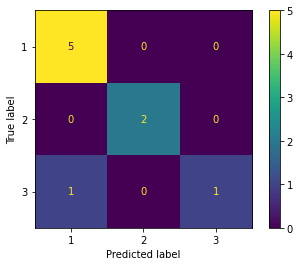

Courbes ROC


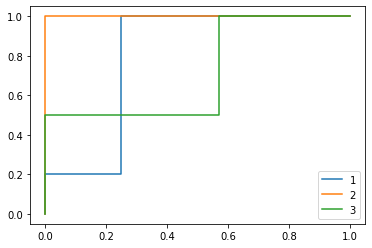

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.75      0.84      0.79        43
           2       0.67      0.53      0.59        15
           3       0.38      0.30      0.33        10

    accuracy                           0.69        68
   macro avg       0.60      0.56      0.57        68
weighted avg       0.68      0.69      0.68        68

Matrice de confusion: 


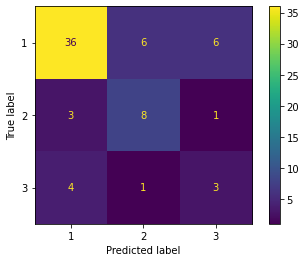

Courbes ROC


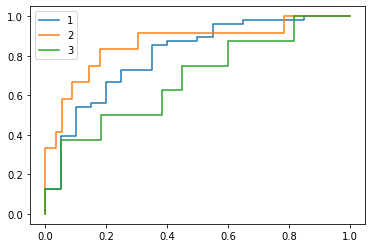

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.69      0.87      0.77        38
           2       0.83      0.45      0.59        22
           3       0.38      0.38      0.38         8

    accuracy                           0.68        68
   macro avg       0.63      0.57      0.58        68
weighted avg       0.70      0.68      0.66        68

Matrice de confusion: 


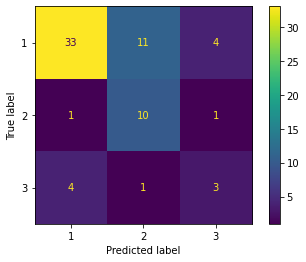

Courbes ROC


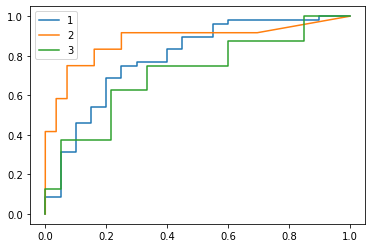

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.71      0.87      0.78        39
           2       0.75      0.47      0.58        19
           3       0.38      0.30      0.33        10

    accuracy                           0.68        68
   macro avg       0.61      0.55      0.57        68
weighted avg       0.67      0.68      0.66        68

Matrice de confusion: 


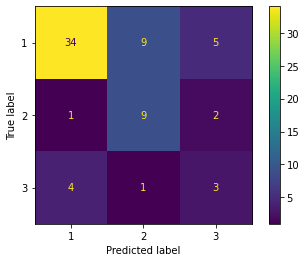

Courbes ROC


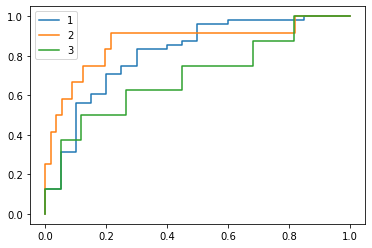

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.71      0.85      0.77        40
           2       0.67      0.50      0.57        16
           3       0.38      0.25      0.30        12

    accuracy                           0.66        68
   macro avg       0.58      0.53      0.55        68
weighted avg       0.64      0.66      0.64        68

Matrice de confusion: 


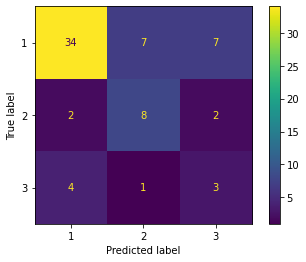

Courbes ROC


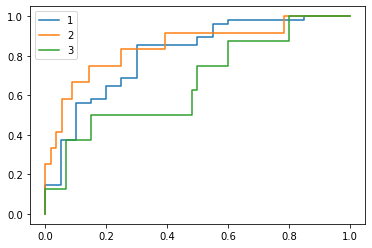

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.65      0.86      0.74        36
           2       0.83      0.48      0.61        21
           3       0.38      0.27      0.32        11

    accuracy                           0.65        68
   macro avg       0.62      0.54      0.55        68
weighted avg       0.66      0.65      0.63        68

Matrice de confusion: 


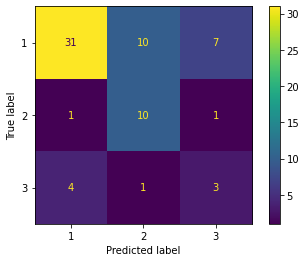

Courbes ROC


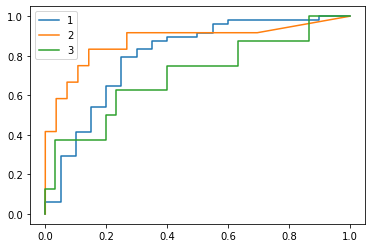

In [36]:
from sklearn.naive_bayes import GaussianNB

naive_bayes = MyAlgorithm(GaussianNB(), train_data, test_data)
naive_bayes.build_algorithm()
nb_accuracies = naive_bayes.get_accuracies()


In [37]:
nb_accuracies

[0.8888888888888888,
 0.6911764705882353,
 0.6764705882352942,
 0.6764705882352942,
 0.6617647058823529,
 0.6470588235294118]

Le théorème de Naive Bayes se base sur le fait que nous possédons une connaissance a priori. Pour un problème de classification, cet algorithme assume que les événements sont indépendants un de l'autre ce qui simplifie la tâche.

### Régression Logistique

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.80      0.80      0.80         5
           2       1.00      0.67      0.80         3
           3       0.50      1.00      0.67         1

    accuracy                           0.78         9
   macro avg       0.77      0.82      0.76         9
weighted avg       0.83      0.78      0.79         9

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


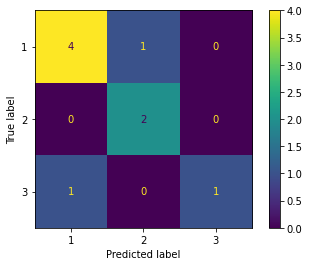

Courbes ROC


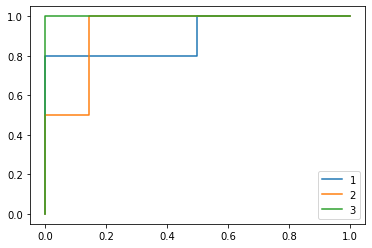

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.80      0.83        51
           2       0.58      0.58      0.58        12
           3       0.12      0.20      0.15         5

    accuracy                           0.72        68
   macro avg       0.52      0.53      0.52        68
weighted avg       0.75      0.72      0.74        68

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


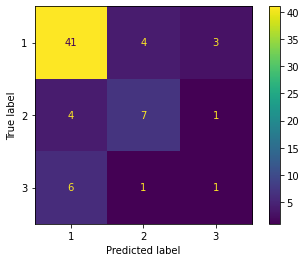

Courbes ROC


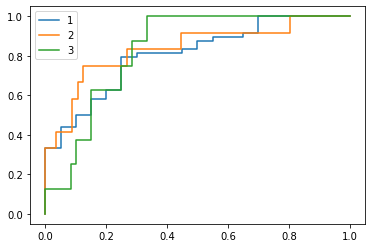

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.81      0.84        52
           2       0.58      0.54      0.56        13
           3       0.12      0.33      0.18         3

    accuracy                           0.74        68
   macro avg       0.53      0.56      0.53        68
weighted avg       0.79      0.74      0.76        68

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


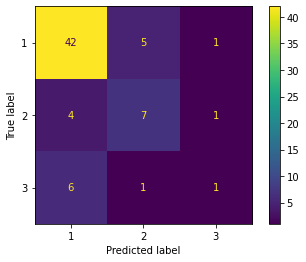

Courbes ROC


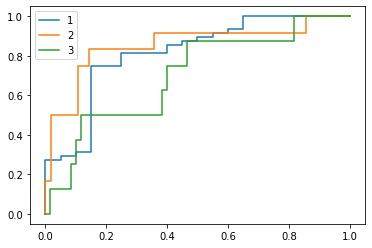

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.81      0.84        52
           2       0.67      0.57      0.62        14
           3       0.12      0.50      0.20         2

    accuracy                           0.75        68
   macro avg       0.56      0.63      0.55        68
weighted avg       0.81      0.75      0.77        68

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


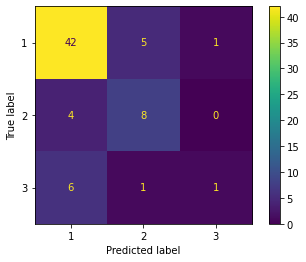

Courbes ROC


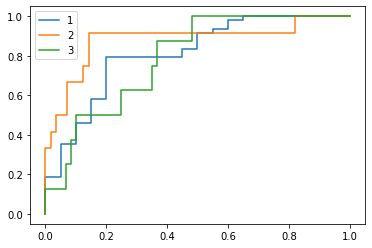

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.82      0.82        49
           2       0.58      0.50      0.54        14
           3       0.12      0.20      0.15         5

    accuracy                           0.71        68
   macro avg       0.51      0.51      0.51        68
weighted avg       0.73      0.71      0.72        68

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


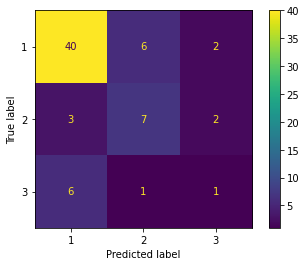

Courbes ROC


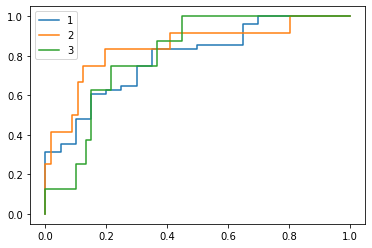

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.90      0.83      0.86        52
           2       0.67      0.57      0.62        14
           3       0.12      0.50      0.20         2

    accuracy                           0.76        68
   macro avg       0.56      0.63      0.56        68
weighted avg       0.83      0.76      0.79        68

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


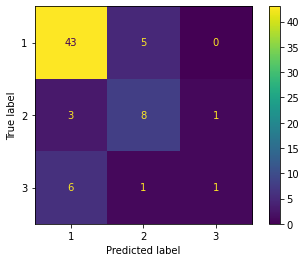

Courbes ROC


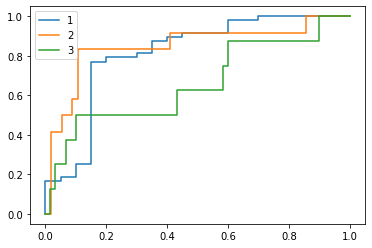

In [38]:
from sklearn.linear_model import LogisticRegression

logistic_regression = MyAlgorithm(LogisticRegression(random_state=seed) , train_data, test_data)
logistic_regression.build_algorithm()
lg_accuracies = logistic_regression.get_accuracies()

In [39]:
lg_accuracies

[0.7777777777777778,
 0.7205882352941176,
 0.7352941176470589,
 0.75,
 0.7058823529411765,
 0.7647058823529411]

La régression logistique a comme objectif de produire une valeur discrète contrairement à la régression linéaire qui sert à prédire une valeur réelle. Cet algorithme effectue une somme pondérée des variables en entrées, mais fait passer les résultats à travers une fonction non linéaire a la fin. Ces fonctions peuvent être la fonction logistique ou la fonction sigmoïde qui permettra d'avoir la sortie y.

### Decision Tree

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.60      0.60      0.60         5
           2       0.50      0.33      0.40         3
           3       0.00      0.00      0.00         1

    accuracy                           0.44         9
   macro avg       0.37      0.31      0.33         9
weighted avg       0.50      0.44      0.47         9

Matrice de confusion: 


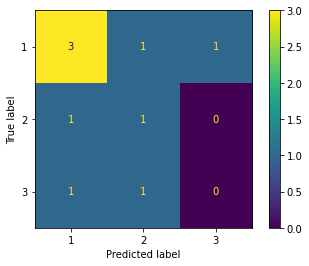

Courbes ROC


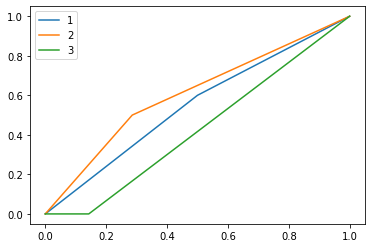

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.69      0.77      0.73        43
           2       0.42      0.31      0.36        16
           3       0.12      0.11      0.12         9

    accuracy                           0.57        68
   macro avg       0.41      0.40      0.40        68
weighted avg       0.55      0.57      0.56        68

Matrice de confusion: 


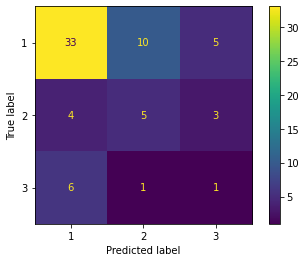

Courbes ROC


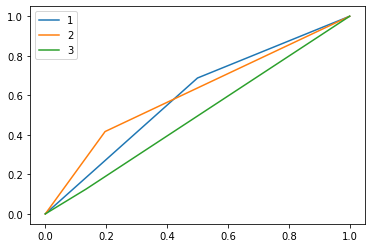

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.73      0.81      0.77        43
           2       0.58      0.41      0.48        17
           3       0.25      0.25      0.25         8

    accuracy                           0.65        68
   macro avg       0.52      0.49      0.50        68
weighted avg       0.64      0.65      0.64        68

Matrice de confusion: 


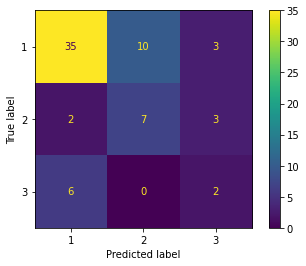

Courbes ROC


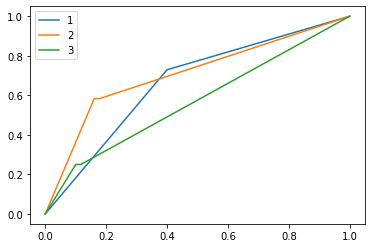

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.79      0.81      0.80        47
           2       0.58      0.47      0.52        15
           3       0.25      0.33      0.29         6

    accuracy                           0.69        68
   macro avg       0.54      0.54      0.53        68
weighted avg       0.70      0.69      0.69        68

Matrice de confusion: 


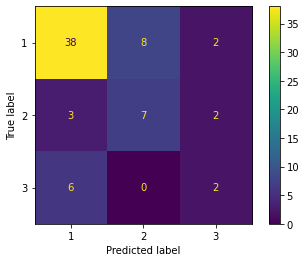

Courbes ROC


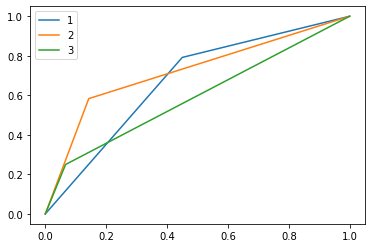

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.75      0.77      0.76        47
           2       0.67      0.50      0.57        16
           3       0.12      0.20      0.15         5

    accuracy                           0.66        68
   macro avg       0.51      0.49      0.49        68
weighted avg       0.68      0.66      0.67        68

Matrice de confusion: 


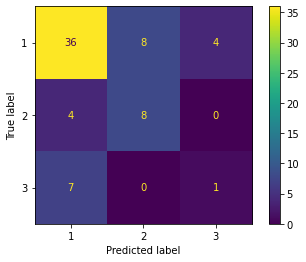

Courbes ROC


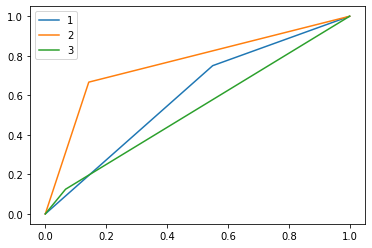

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.67      0.76      0.71        42
           2       0.50      0.35      0.41        17
           3       0.38      0.33      0.35         9

    accuracy                           0.60        68
   macro avg       0.51      0.48      0.49        68
weighted avg       0.59      0.60      0.59        68

Matrice de confusion: 


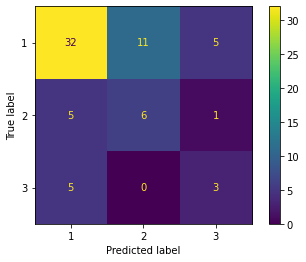

Courbes ROC


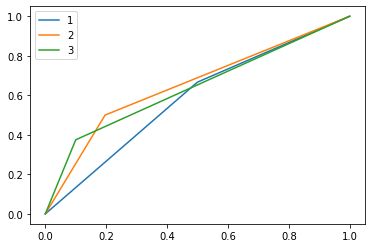

In [40]:
from sklearn.tree import DecisionTreeClassifier

decision_tree = MyAlgorithm(DecisionTreeClassifier(random_state=seed) , train_data, test_data)
decision_tree.build_algorithm()
decision_tree_accuracies = decision_tree.get_accuracies()

In [41]:
decision_tree_accuracies

[0.4444444444444444,
 0.5735294117647058,
 0.6470588235294118,
 0.6911764705882353,
 0.6617647058823529,
 0.6029411764705882]

Les arbres de décision se basent sur les observations représentées sous forme de branches pour aboutir à des conclusions qui représentent les feuilles. En observant les résultats, j'ai pu voir que que les courbes ROC ne sont pas très bonnes. En effet, celles-ci devraient suivre les axes des x et des y pour avoir une allure optimale. Les courbes pour ce modèle effecuent un faible séparation et une séparation aléatoire ce n'est pas bon. Cette mauvaise performance est aussi reflétée dans les autres mesures telles que les accuracies. 
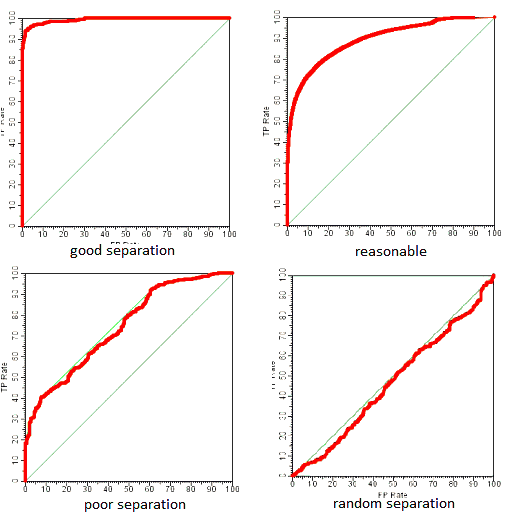

### KNN

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.80      0.80      0.80         5
           2       1.00      0.50      0.67         4
           3       0.00      0.00      0.00         0

    accuracy                           0.67         9
   macro avg       0.60      0.43      0.49         9
weighted avg       0.89      0.67      0.74         9

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


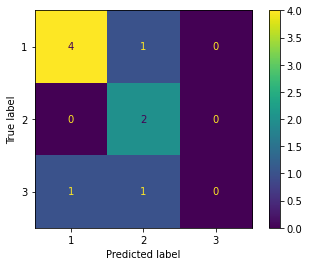

Courbes ROC


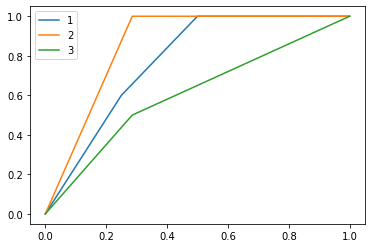

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.84      0.85        49
           2       0.58      0.50      0.54        14
           3       0.25      0.40      0.31         5

    accuracy                           0.74        68
   macro avg       0.56      0.58      0.56        68
weighted avg       0.75      0.74      0.74        68

Matrice de confusion: 


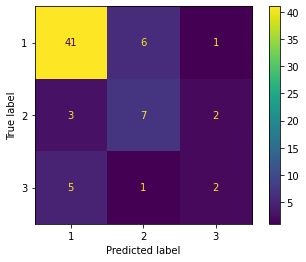

Courbes ROC


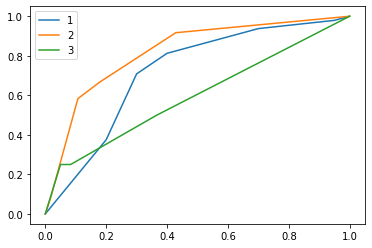

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.80      0.83        51
           2       0.50      0.46      0.48        13
           3       0.25      0.50      0.33         4

    accuracy                           0.72        68
   macro avg       0.53      0.59      0.55        68
weighted avg       0.75      0.72      0.73        68

Matrice de confusion: 


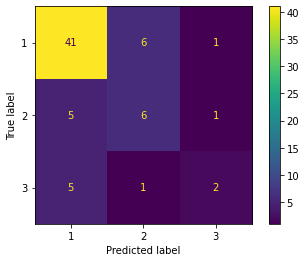

Courbes ROC


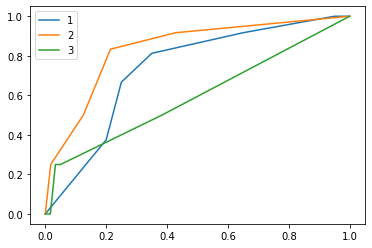

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.78      0.82        54
           2       0.50      0.55      0.52        11
           3       0.25      0.67      0.36         3

    accuracy                           0.74        68
   macro avg       0.54      0.66      0.57        68
weighted avg       0.79      0.74      0.75        68

Matrice de confusion: 


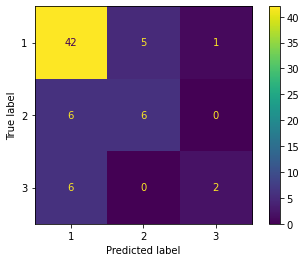

Courbes ROC


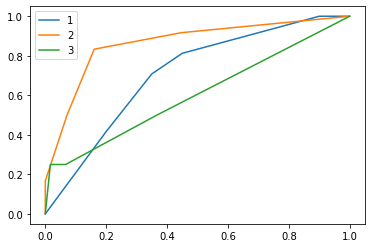

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.84      0.85        49
           2       0.67      0.53      0.59        15
           3       0.25      0.50      0.33         4

    accuracy                           0.75        68
   macro avg       0.59      0.62      0.59        68
weighted avg       0.78      0.75      0.76        68

Matrice de confusion: 


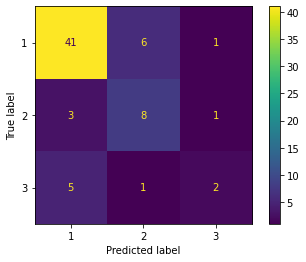

Courbes ROC


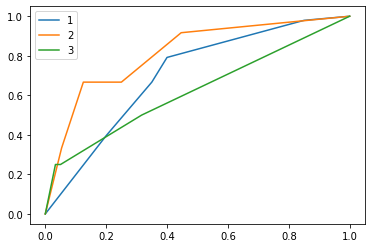

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.92      0.85      0.88        52
           2       0.67      0.67      0.67        12
           3       0.25      0.50      0.33         4

    accuracy                           0.79        68
   macro avg       0.61      0.67      0.63        68
weighted avg       0.83      0.79      0.81        68

Matrice de confusion: 


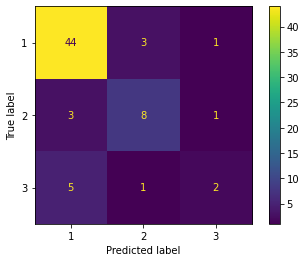

Courbes ROC


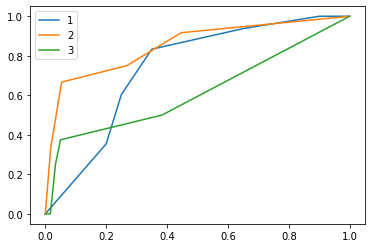

In [42]:
from sklearn.neighbors import KNeighborsClassifier

knn = MyAlgorithm(KNeighborsClassifier(), train_data, test_data)
knn.build_algorithm()
knn_accuracies = knn.get_accuracies()

In [43]:
knn_accuracies

[0.6666666666666666,
 0.7352941176470589,
 0.7205882352941176,
 0.7352941176470589,
 0.75,
 0.7941176470588235]

L'objectif de cet algorithme est de separer les points en differentes classes. Il ne se base pas necessairement sur un entrainement et peut classifier les donnees dependamment de la majorite des votes de ces voisins.

### Bagging (GBT)

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       1.00      0.83      0.91         6
           2       1.00      0.67      0.80         3
           3       0.00      0.00      0.00         0

    accuracy                           0.78         9
   macro avg       0.67      0.50      0.57         9
weighted avg       1.00      0.78      0.87         9

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


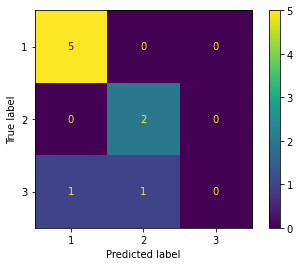

Courbes ROC


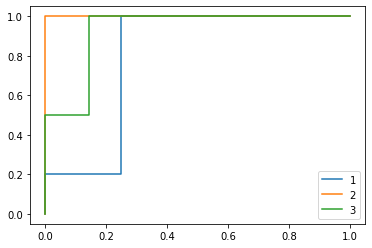

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.81      0.81      0.81        48
           2       0.50      0.46      0.48        13
           3       0.38      0.43      0.40         7

    accuracy                           0.71        68
   macro avg       0.56      0.57      0.56        68
weighted avg       0.71      0.71      0.71        68

Matrice de confusion: 


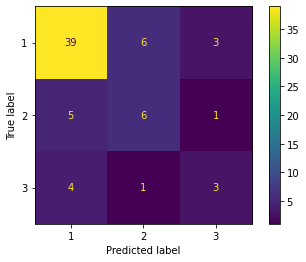

Courbes ROC


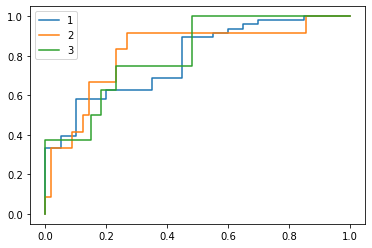

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.83      0.83        48
           2       0.58      0.44      0.50        16
           3       0.38      0.75      0.50         4

    accuracy                           0.74        68
   macro avg       0.60      0.67      0.61        68
weighted avg       0.75      0.74      0.74        68

Matrice de confusion: 


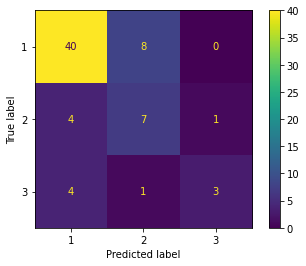

Courbes ROC


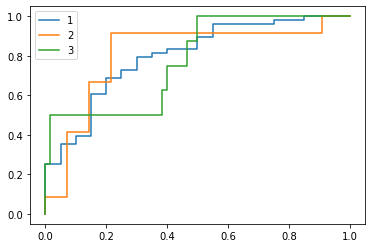

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.77      0.82      0.80        45
           2       0.50      0.46      0.48        13
           3       0.50      0.40      0.44        10

    accuracy                           0.69        68
   macro avg       0.59      0.56      0.57        68
weighted avg       0.68      0.69      0.68        68

Matrice de confusion: 


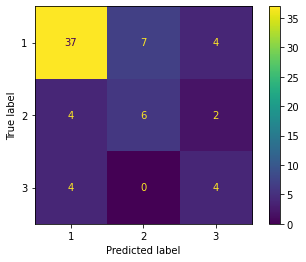

Courbes ROC


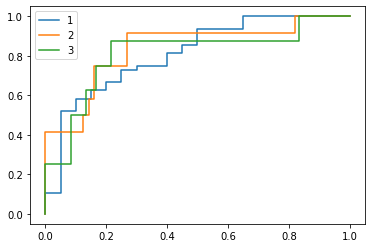

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.77      0.86      0.81        43
           2       0.58      0.50      0.54        14
           3       0.50      0.36      0.42        11

    accuracy                           0.71        68
   macro avg       0.62      0.57      0.59        68
weighted avg       0.69      0.71      0.69        68

Matrice de confusion: 


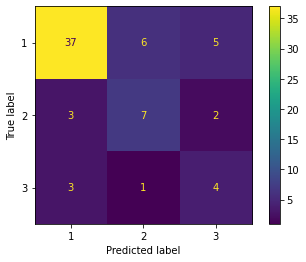

Courbes ROC


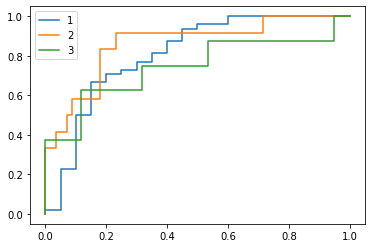

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.81      0.87      0.84        45
           2       0.67      0.53      0.59        15
           3       0.38      0.38      0.38         8

    accuracy                           0.74        68
   macro avg       0.62      0.59      0.60        68
weighted avg       0.73      0.74      0.73        68

Matrice de confusion: 


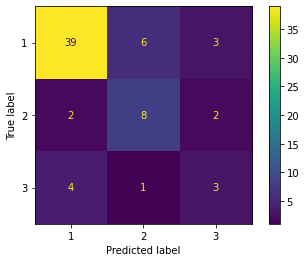

Courbes ROC


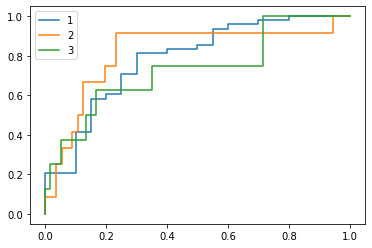

In [44]:
from sklearn.ensemble import GradientBoostingClassifier

gbt = MyAlgorithm(GradientBoostingClassifier(random_state=seed), train_data, test_data)
gbt.build_algorithm()
gbt_accuracies = gbt.get_accuracies()

In [45]:
gbt_accuracies

[0.7777777777777778,
 0.7058823529411765,
 0.7352941176470589,
 0.6911764705882353,
 0.7058823529411765,
 0.7352941176470589]

Un algorithme de gradient boosting consiste en une combinaison de plusieurs algorithmes de decsion tree combines ensemble. De manière séquentielle, des algorithmes de classifications faibles sont appliqués. Les arbres de boosting visent à augmenter l'accuracy de manière graduelle. 

### Ada Boost (Naive Bayes)

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.80      0.67      0.73         6
           2       0.50      0.33      0.40         3
           3       0.00      0.00      0.00         0

    accuracy                           0.56         9
   macro avg       0.43      0.33      0.38         9
weighted avg       0.70      0.56      0.62         9

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


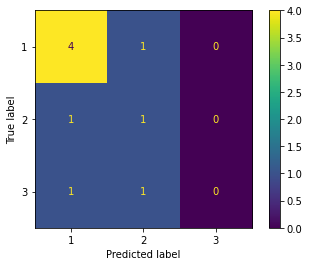

Courbes ROC


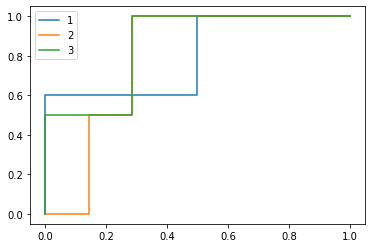

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.73      0.76      0.74        46
           2       0.58      0.47      0.52        15
           3       0.12      0.14      0.13         7

    accuracy                           0.63        68
   macro avg       0.48      0.46      0.47        68
weighted avg       0.63      0.63      0.63        68

Matrice de confusion: 


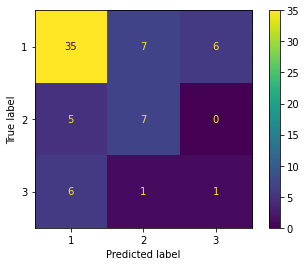

Courbes ROC


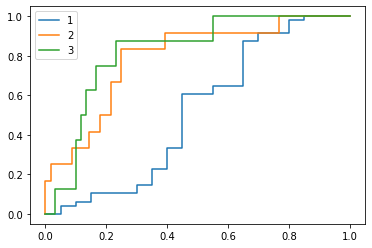

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.60      0.71      0.65        41
           2       0.33      0.33      0.33        12
           3       0.25      0.13      0.17        15

    accuracy                           0.51        68
   macro avg       0.40      0.39      0.39        68
weighted avg       0.48      0.51      0.49        68

Matrice de confusion: 


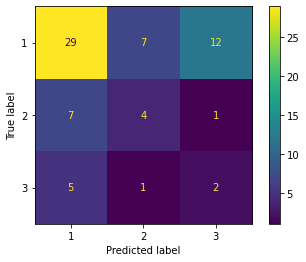

Courbes ROC


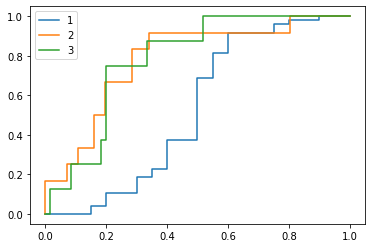

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.75      0.77      0.76        47
           2       0.42      0.50      0.45        10
           3       0.38      0.27      0.32        11

    accuracy                           0.65        68
   macro avg       0.51      0.51      0.51        68
weighted avg       0.64      0.65      0.64        68

Matrice de confusion: 


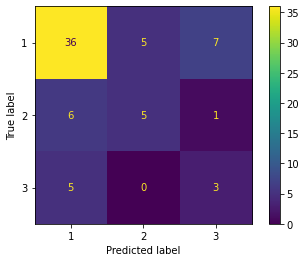

Courbes ROC


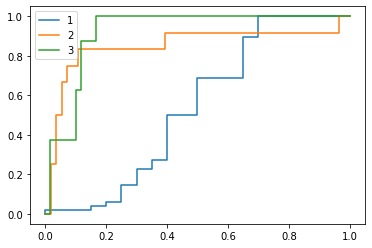

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.65      0.84      0.73        37
           2       0.67      0.57      0.62        14
           3       0.50      0.24      0.32        17

    accuracy                           0.63        68
   macro avg       0.60      0.55      0.55        68
weighted avg       0.61      0.63      0.60        68

Matrice de confusion: 


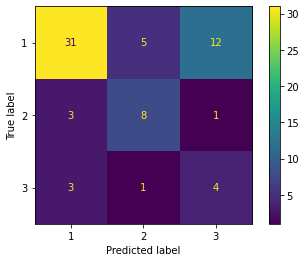

Courbes ROC


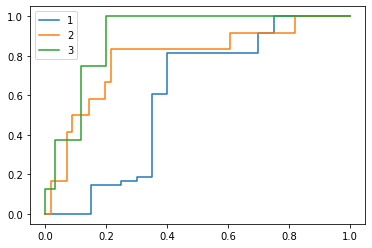

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.73      0.80      0.76        44
           2       0.58      0.50      0.54        14
           3       0.25      0.20      0.22        10

    accuracy                           0.65        68
   macro avg       0.52      0.50      0.51        68
weighted avg       0.63      0.65      0.64        68

Matrice de confusion: 


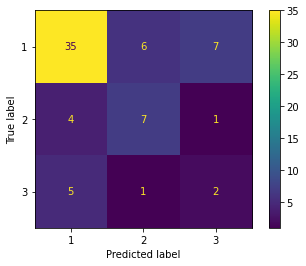

Courbes ROC


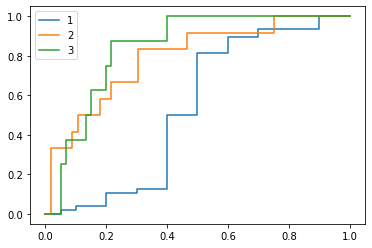

In [46]:
from sklearn.ensemble import AdaBoostClassifier

ada_boost = MyAlgorithm(AdaBoostClassifier(random_state=seed) , train_data, test_data)
ada_boost.build_algorithm()
ada_boost_accuracies = gbt.get_accuracies()

In [47]:
ada_boost_accuracies

[0.7777777777777778,
 0.7058823529411765,
 0.7352941176470589,
 0.6911764705882353,
 0.7058823529411765,
 0.7352941176470589]

Cet algorithme permet de combiner plusieurs classificateurs faibles en un seul classificateur plus performant. Les faibles classificateurs sont des decisin trees. Il fonctionne principalement en associant plus de poids sur les donnees plus difficiles a classifier. Il est important de noter qu'Ada Boost est sensible aux bruits et aux donnees aberrantes.

Contrairement aux autres algorithmes celui-ci semble mieux gérer les données de la classe 3. Effectivement, dans la majorité des cas, les courbes pour la classe 3 semblaient moins bonnes que celles des autres classes pour les autres modèles. Cependant, pour Ada boost, celui-ci semble mieux classifier les données de cette catégorie, mais a un peu plus de misère pour les données de la classe 1. Cela pourrait s'expliquer par le fait que se modèle est sensible aux bruits et que la classe 1 contient plus de valeurs se qui augmente la présence de bruits et données aberrantes. 

### Random Forest

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       1.00      0.83      0.91         6
           2       1.00      0.67      0.80         3
           3       0.00      0.00      0.00         0

    accuracy                           0.78         9
   macro avg       0.67      0.50      0.57         9
weighted avg       1.00      0.78      0.87         9

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


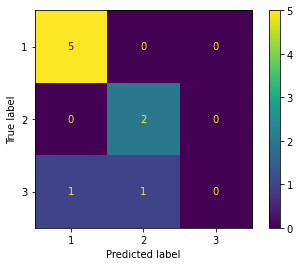

Courbes ROC


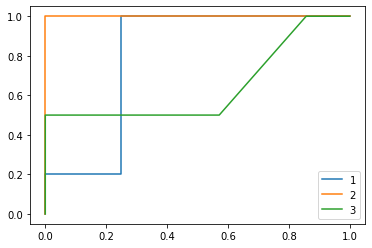

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.84      0.86        50
           2       0.67      0.53      0.59        15
           3       0.12      0.33      0.18         3

    accuracy                           0.75        68
   macro avg       0.56      0.57      0.54        68
weighted avg       0.80      0.75      0.77        68

Matrice de confusion: 


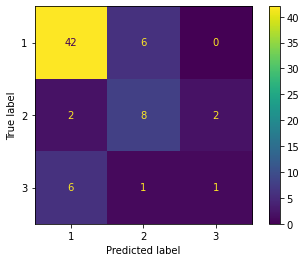

Courbes ROC


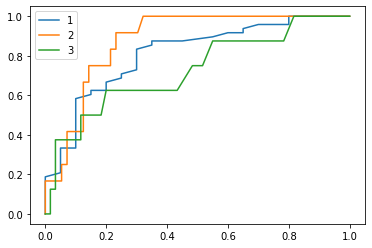

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.80      0.83        51
           2       0.58      0.47      0.52        15
           3       0.12      0.50      0.20         2

    accuracy                           0.72        68
   macro avg       0.52      0.59      0.52        68
weighted avg       0.77      0.72      0.74        68

Matrice de confusion: 


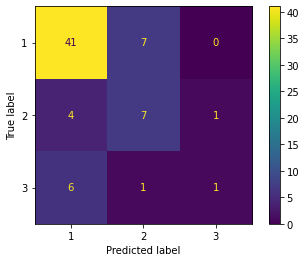

Courbes ROC


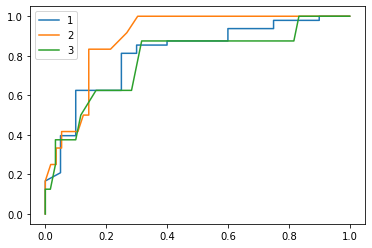

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.81      0.84        52
           2       0.67      0.53      0.59        15
           3       0.12      1.00      0.22         1

    accuracy                           0.75        68
   macro avg       0.56      0.78      0.55        68
weighted avg       0.82      0.75      0.78        68

Matrice de confusion: 


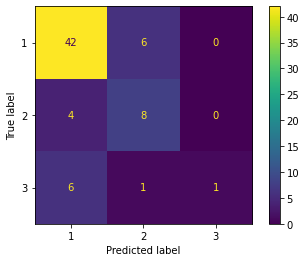

Courbes ROC


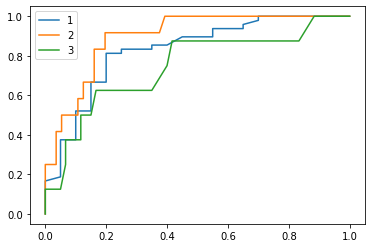

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.83      0.83        48
           2       0.83      0.56      0.67        18
           3       0.12      0.50      0.20         2

    accuracy                           0.75        68
   macro avg       0.60      0.63      0.57        68
weighted avg       0.81      0.75      0.77        68

Matrice de confusion: 


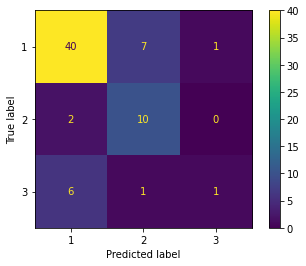

Courbes ROC


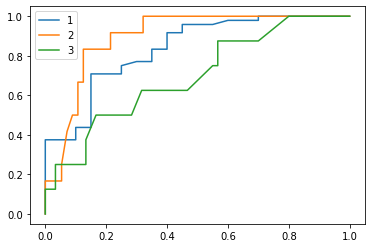

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.90      0.86      0.88        50
           2       0.75      0.60      0.67        15
           3       0.25      0.67      0.36         3

    accuracy                           0.79        68
   macro avg       0.63      0.71      0.64        68
weighted avg       0.84      0.79      0.81        68

Matrice de confusion: 


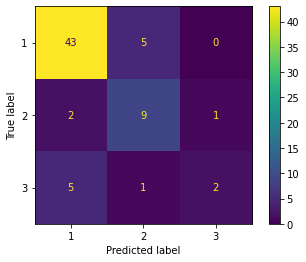

Courbes ROC


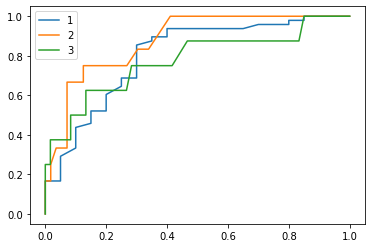

In [48]:
from sklearn.ensemble import RandomForestClassifier

random_forest = MyAlgorithm(RandomForestClassifier(random_state=seed), train_data, test_data)
random_forest.build_algorithm()
random_forest_accuracies = random_forest.get_accuracies()

In [49]:
random_forest_accuracies

[0.7777777777777778, 0.75, 0.7205882352941176, 0.75, 0.75, 0.7941176470588235]

L'algorithme de Random Forest prend en compte les limitations des algorithmes de decision tree. Il consiste principalement en plusieurs arbres de décisions. Tous ces arbres sont combinés en un seul arbre pour un problème de classification ou de régression. Pour un problème de classification, chaque arbre prédira une classe. Cette prédiction agit en tant que vote. La classe avec le plus grand nombre de votes sera prise en compte.

In [50]:
all_accuracies = []
all_accuracies.append(nb_accuracies)
all_accuracies.append(lg_accuracies)
all_accuracies.append(decision_tree_accuracies)
all_accuracies.append(knn_accuracies)
all_accuracies.append(gbt_accuracies)
all_accuracies.append(ada_boost_accuracies)
all_accuracies.append(random_forest_accuracies)

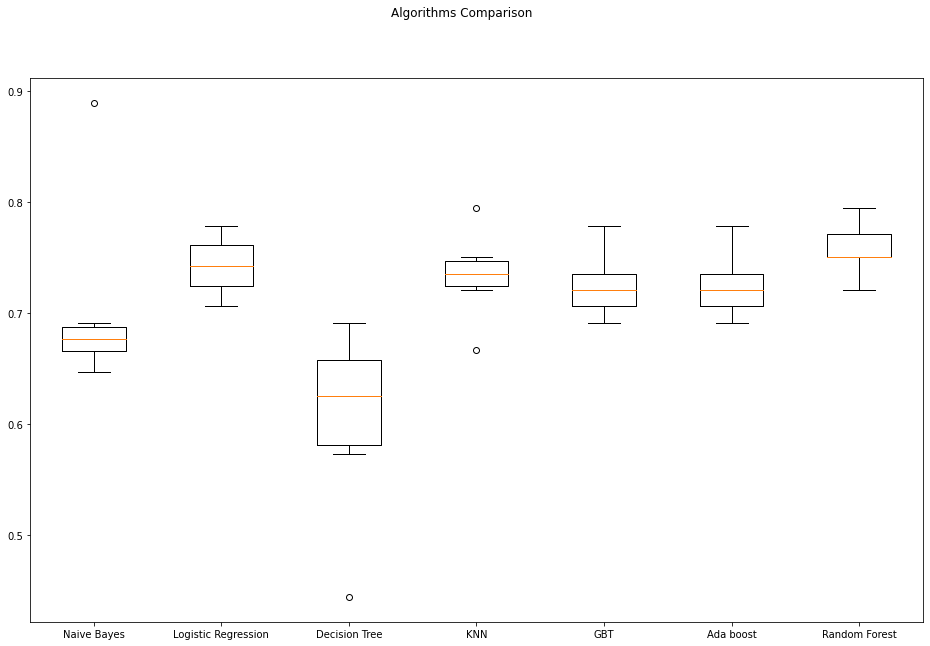

In [51]:
names = ["Naive Bayes", "Logistic Regression", "Decision Tree", "KNN", "GBT", "Ada boost", "Random Forest"]
fig = plt.figure(figsize=(16,10))
fig.suptitle('Algorithms Comparison')
ax = fig.add_subplot(111)
plt.boxplot(all_accuracies)
ax.set_xticklabels(names)
plt.show()

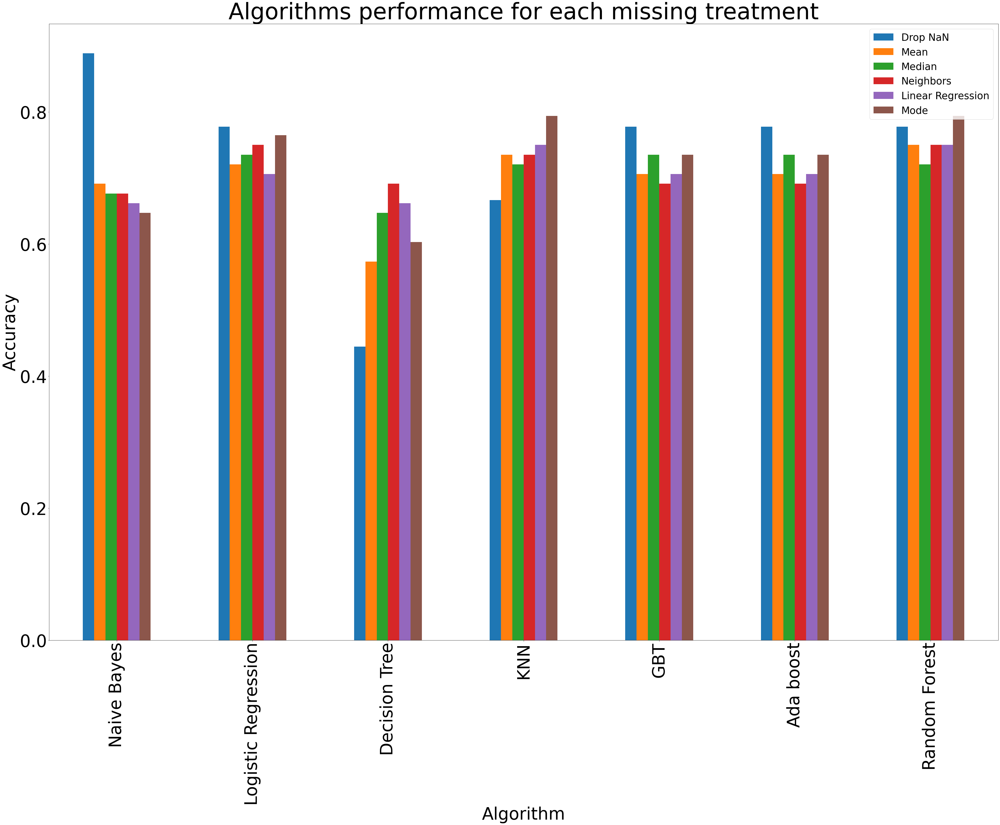

In [52]:
drop_nan_list = []
mean_list = []
median_list = []
neighbors_list = []
linear_reg_list = [] 
mode_list = []

for data in all_accuracies:
    drop_nan_list.append(data[0])
    mean_list.append(data[1])
    median_list.append(data[2])
    neighbors_list.append(data[3])
    linear_reg_list.append(data[4])
    mode_list.append(data[5])
    
plotdata = pd.DataFrame({
    "Drop NaN": drop_nan_list,
    "Mean": mean_list,
    "Median": median_list,
    "Neighbors": neighbors_list,
    "Linear Regression": linear_reg_list,
    "Mode": mode_list
    }, 
    index=["Naive Bayes", "Logistic Regression", "Decision Tree", "KNN", "GBT", "Ada boost", "Random Forest"]
)
my_plot = plotdata.plot(kind="bar", figsize=(60,40), fontsize=60)
plt.title("Algorithms performance for each missing treatment", fontsize=80)
plt.xlabel("Algorithm", fontsize=60)
plt.ylabel("Accuracy", fontsize=60)
my_plot.legend(fontsize=35)

In [53]:
plotdata

,Drop NaN,Mean,Median,Neighbors,Linear Regression,Mode
Naive Bayes,0.888889,0.691176,0.676471,0.676471,0.661765,0.647059
Logistic Regression,0.777778,0.720588,0.735294,0.750000,0.705882,0.764706
Decision Tree,0.444444,0.573529,0.647059,0.691176,0.661765,0.602941
KNN,0.666667,0.735294,0.720588,0.735294,0.750000,0.794118
GBT,0.777778,0.705882,0.735294,0.691176,0.705882,0.735294
Ada boost,0.777778,0.705882,0.735294,0.691176,0.705882,0.735294
Random Forest,0.777778,0.750000,0.720588,0.750000,0.750000,0.794118


Dans cette section je mesure la Precision = True Positives / (True Positives + False Positives), le Recall = True Positives / (True Positives + False Negatives), le F1 score = 2* ((Precision * Recall) / (Precision + Recall)) et la courbe ROC qui est une représentation graphique du taux de vrais positifs (en y) (True Positive Rate = True Positives / (True Positives + False Negatives)) par rapport au taux de faux positifs (en x) (False Positive Rate = False Positives / (False Positives + True Negatives)). Aussi, l'accuracy est calculée pour permettre de comparer le taux de prédictions similaires aux valeurs actuelles. La matrice de confusion nous permet de bien voir les nombre de vrais positifs, faux positifs, vrais négatifs et faux négatifs.

### - Quelle est la technique qui donne le meilleur résultat?

Dans mon cas, en regardant les graphiques et les tableaux représentant mes accuracies, je me suis aperçu que la technique de traitement où on laisse tomber les valeurs manquantes donne de bonnes accuracy en général avec un maximum de 0.89 pour l'algorithme de Naive Bayes. Ces bons scores s'expliquent par le fait qu'après avoir laissé tomber toutes les lignes avec des données manquantes, il ne reste plus que 9 données sur lesquels nous pouvons tester. Cela est un nombre très faible, ce qui fait en sorte que les scores obtenus ne sont pas significatifs. Alors, j'ai décidé d'ignorer cette technique puisqu'elle ne représente clairement pas la technique optimale pour cet ensemble de données, car il existe de nombreuses données manquantes. Par conséquent, en regardant les autres techniques, j'ai pu voir que ma technique de remplacement avec le mode des colonnes donnait de très bons résultats. 

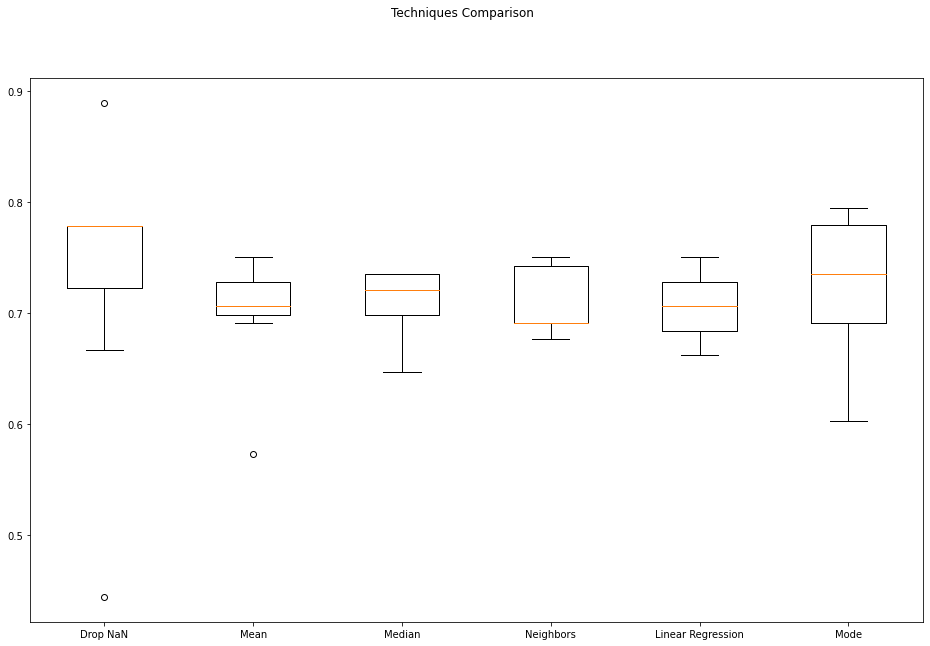

In [54]:
techniques_accuracies = []
techniques_accuracies.append(drop_nan_list)
techniques_accuracies.append(mean_list)
techniques_accuracies.append(median_list)
techniques_accuracies.append(neighbors_list)
techniques_accuracies.append(linear_reg_list)
techniques_accuracies.append(mode_list)

names = [
    "Drop NaN",
    "Mean",
    "Median",
    "Neighbors",
    "Linear Regression",
    "Mode"]
fig = plt.figure(figsize=(16,10))
fig.suptitle('Techniques Comparison')
ax = fig.add_subplot(111)
plt.boxplot(techniques_accuracies)
ax.set_xticklabels(names)
plt.show()

En effet, en regardant les boîtes à moustaches dans le graphique précédent, je peux clairement voir que mode a de plus bons résultats que les autres en ignorant la technique 1, soit de laisser tomber les valeurs manquantes. Avec mode, j'obtiens des accuracies très proches de 80% avec la régression logistique, KNN et Random Forest.

### - Quel est l'algorithme qui donne le meilleur résultat?


Mon meilleur algorithme est celui de Random Forest. En effet, en observant les boîtes à moustaches, je peux clairement voir qu'il obtient des résultats plus performants en ce qui terme d'accuracy. Malgré qu'il obtienne la même accuracy que KNN avec la technique de remplacement avec le mode, en observant les courbes ROC de Random Forest et les autres mesures, j'ai pu conclure que les résulats pour mon Random Forest étaient meilleurs.

## 7) Recherches les caractéristiques pertinentes

En analysant toutes mes métriques, j'ai conclu que mes deux meilleures techniques étaient la médiane et le mode. Il s'agit des dataframes aux emplacement 2 (Médiane) et 5 (Mode).

### Colonnes initiales

In [55]:
initial_columns_list = list(train_data[2][0].columns)
initial_columns_list

['surgery',
 'age',
 'rectal_temperature',
 'pulse',
 'respiratory_rate',
 'temperature_extremities',
 'peripheral_pulse',
 'mucous_membranes',
 'capillary_refill_time',
 'pain',
 'peristalsis',
 'abdominal_distension',
 'nasogastric_tube',
 'nasogastric_reflux',
 'feces',
 'abdomen',
 'packed_cell_volume',
 'total_protein',
 'surgical_lesion']

Puisque mon meilleur algorithme est celui de Random Forest, il sera utilisé pour la sélection de features importantes. 

In [56]:
from matplotlib import pyplot

def generate_feature_importance_plot(importance_scores):
    # Résumé des importances des attributs pour mon algorithme de Random Forest
    for i,v in enumerate(importance_scores):
        feature_name = initial_columns_list[i]
        print('Feature: %s, Score: %.5f' % (feature_name,v))
    # Plot des importances 
    pyplot.bar(initial_columns_list, importance_scores)
    plt.title("Score d'importance de chaque attribut")
    plt.xlabel("Attribut")
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("Score d'importance")
    plt.figure(figsize= (200, 70))
    pyplot.show()

### Technique de la médiane

#### Approche 1

In [57]:
random_forest = RandomForestClassifier(random_state=seed)
random_forest.fit(train_data[2][0], train_data[2][1])
importance = random_forest.feature_importances_ 

Feature: surgery, Score: 0.02922
Feature: age, Score: 0.00982
Feature: rectal_temperature, Score: 0.07625
Feature: pulse, Score: 0.10496
Feature: respiratory_rate, Score: 0.07208
Feature: temperature_extremities, Score: 0.04119
Feature: peripheral_pulse, Score: 0.04412
Feature: mucous_membranes, Score: 0.05430
Feature: capillary_refill_time, Score: 0.02603
Feature: pain, Score: 0.07525
Feature: peristalsis, Score: 0.02628
Feature: abdominal_distension, Score: 0.04962
Feature: nasogastric_tube, Score: 0.02204
Feature: nasogastric_reflux, Score: 0.02456
Feature: feces, Score: 0.02478
Feature: abdomen, Score: 0.02911
Feature: packed_cell_volume, Score: 0.12435
Feature: total_protein, Score: 0.13188
Feature: surgical_lesion, Score: 0.03418


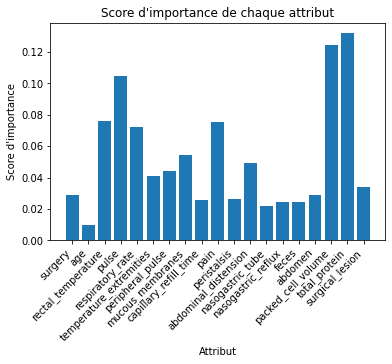

<Figure size 14400x5040 with 0 Axes>

In [58]:
generate_feature_importance_plot(importance)

In [59]:
# Je cherche les 6 meilleurs attributs
top_features_indices = importance.argsort()[-6:][::-1]
top_features_names = []
for i in top_features_indices:
    top_features_names.append(initial_columns_list[i])
    
top_features_names

['total_protein',
 'packed_cell_volume',
 'pulse',
 'rectal_temperature',
 'pain',
 'respiratory_rate']

#### Approche 2

In [60]:
from sklearn.feature_selection import SelectKBest, chi2

select_kbest = SelectKBest(chi2, k=6)
select_kbest.fit_transform(train_data[2][0], train_data[2][1])

array([[ 66. ,   3. ,   3. ,   5. ,  45. ,   8.4],
       [ 88. ,   2. ,   4. ,   3. ,  50. ,  85. ],
       [ 40. ,   1. ,   3. ,   3. ,  33. ,   6.7],
       ...,
       [ 72. ,   3. ,   4. ,   4. ,  60. ,   6.8],
       [100. ,   3. ,   3. ,   3. ,  50. ,   6. ],
       [ 40. ,   2. ,   3. ,   3. ,  36. ,  62. ]])

Feature: surgery, Score: 1.81804
Feature: age, Score: 18.67805
Feature: rectal_temperature, Score: 0.01049
Feature: pulse, Score: 391.72711
Feature: respiratory_rate, Score: 12.52827
Feature: temperature_extremities, Score: 12.23183
Feature: peripheral_pulse, Score: 18.88264
Feature: mucous_membranes, Score: 38.11892
Feature: capillary_refill_time, Score: 4.92036
Feature: pain, Score: 18.87893
Feature: peristalsis, Score: 7.77515
Feature: abdominal_distension, Score: 14.95372
Feature: nasogastric_tube, Score: 0.07172
Feature: nasogastric_reflux, Score: 4.62823
Feature: feces, Score: 4.69660
Feature: abdomen, Score: 6.00317
Feature: packed_cell_volume, Score: 105.65969
Feature: total_protein, Score: 1268.60237
Feature: surgical_lesion, Score: 5.61851


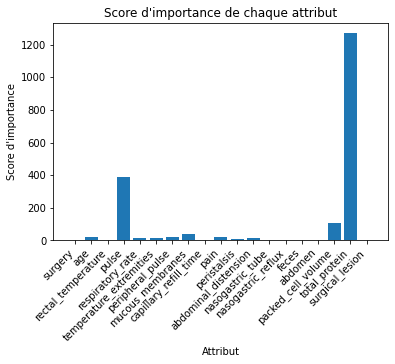

<Figure size 14400x5040 with 0 Axes>

In [61]:
generate_feature_importance_plot(select_kbest.scores_)

In [62]:
# Je cherche les 6 meilleurs attributs
top_features_indices = select_kbest.scores_.argsort()[-6:][::-1]
top_features_names = []
for i in top_features_indices:
    top_features_names.append(initial_columns_list[i])
    
top_features_names

['total_protein',
 'pulse',
 'packed_cell_volume',
 'mucous_membranes',
 'peripheral_pulse',
 'pain']

### Technique du mode

In [63]:
random_forest = RandomForestClassifier(random_state=seed)
random_forest.fit(train_data[5][0], train_data[5][1])
importance = random_forest.feature_importances_ 

#### Approche 1

Feature: surgery, Score: 0.02955
Feature: age, Score: 0.01034
Feature: rectal_temperature, Score: 0.07572
Feature: pulse, Score: 0.10704
Feature: respiratory_rate, Score: 0.06893
Feature: temperature_extremities, Score: 0.04405
Feature: peripheral_pulse, Score: 0.02699
Feature: mucous_membranes, Score: 0.06303
Feature: capillary_refill_time, Score: 0.02899
Feature: pain, Score: 0.07597
Feature: peristalsis, Score: 0.02827
Feature: abdominal_distension, Score: 0.05168
Feature: nasogastric_tube, Score: 0.02140
Feature: nasogastric_reflux, Score: 0.02340
Feature: feces, Score: 0.02494
Feature: abdomen, Score: 0.02327
Feature: packed_cell_volume, Score: 0.13341
Feature: total_protein, Score: 0.12796
Feature: surgical_lesion, Score: 0.03506


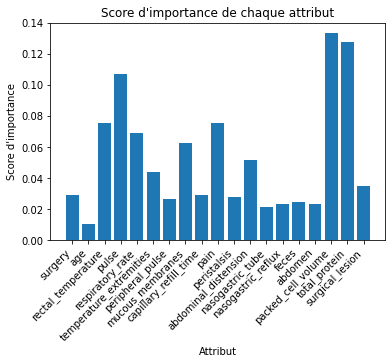

<Figure size 14400x5040 with 0 Axes>

In [64]:
generate_feature_importance_plot(importance)

In [65]:
# Je cherche les 6 meilleurs attributs
top_features_indices = importance.argsort()[-6:][::-1]
top_features_names = []
for i in top_features_indices:
    top_features_names.append(initial_columns_list[i])
    
top_features_names

['packed_cell_volume',
 'total_protein',
 'pulse',
 'pain',
 'rectal_temperature',
 'respiratory_rate']

#### Approche 2

In [66]:
from sklearn.feature_selection import SelectKBest, chi2

select_kbest = SelectKBest(chi2, k=6)
select_kbest.fit_transform(train_data[5][0], train_data[5][1])

array([[ 66. ,   3. ,   1. ,   5. ,  45. ,   8.4],
       [ 88. ,   1. ,   4. ,   3. ,  50. ,  85. ],
       [ 40. ,   1. ,   3. ,   3. ,  33. ,   6.7],
       ...,
       [ 72. ,   3. ,   4. ,   4. ,  60. ,   6.8],
       [100. ,   3. ,   3. ,   3. ,  50. ,   6. ],
       [ 40. ,   1. ,   1. ,   3. ,  36. ,  62. ]])

Feature: surgery, Score: 1.81804
Feature: age, Score: 18.67805
Feature: rectal_temperature, Score: 0.01391
Feature: pulse, Score: 375.90336
Feature: respiratory_rate, Score: 10.07426
Feature: temperature_extremities, Score: 12.23183
Feature: peripheral_pulse, Score: 19.59661
Feature: mucous_membranes, Score: 42.87760
Feature: capillary_refill_time, Score: 4.92036
Feature: pain, Score: 18.87893
Feature: peristalsis, Score: 7.77515
Feature: abdominal_distension, Score: 14.97871
Feature: nasogastric_tube, Score: 0.07172
Feature: nasogastric_reflux, Score: 4.62823
Feature: feces, Score: 5.40893
Feature: abdomen, Score: 4.82476
Feature: packed_cell_volume, Score: 97.29914
Feature: total_protein, Score: 1278.12834
Feature: surgical_lesion, Score: 5.61851


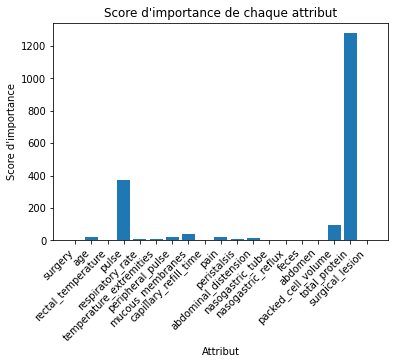

<Figure size 14400x5040 with 0 Axes>

In [67]:
generate_feature_importance_plot(select_kbest.scores_)

In [68]:
# Je cherche les 6 meilleurs attributs
top_features_indices = select_kbest.scores_.argsort()[-6:][::-1]
top_features_names = []
for i in top_features_indices:
    top_features_names.append(initial_columns_list[i])
    
top_features_names

['total_protein',
 'pulse',
 'packed_cell_volume',
 'mucous_membranes',
 'peripheral_pulse',
 'pain']

Pour les deux techniques, en utilisant les deux approches j'obtiens les mêmes résultats pour la même approche. En effet, pour la sélection de features de sklearn en retirant les scores d'importance avec feature_importances_ j'obtiens'packed_cell_volume', 'total_protein', 'pulse','pain','rectal_temperature' et 'respiratory_rate'. En effet, packed_cell_volume obtient un score d'importance de 0.13341 suivi de total_protein avec un score d'importance de 0.12796. Cependant pour la seconde approche, soit celle SelectKBest, j'obtiens 'total_protein', 'pulse', 'packed_cell_volume', 'mucous_membranes', 'peripheral_pulse' et 'pain'. Nous pouvons voir que les features différentes dans les deux approches sont peripheral_pulse, mucous_membranes (approche 2),'rectal_temperature' et 'respiratory_rate' (Approche 1). Les quatre autres features sont communes aux deux approches, alors celles-ci seront préservées. Il s'agit de 'total_protein','pulse','packed_cell_volume' et 'pain'.

Alors, en relisant la documentation et en effectuant quelques recherches, j'ai décidé d'ignorer 'respiratory_rate puisqu'il était indiqué: usefulness is doubtful due to the great fluctuations. Aussi, en lisant la documentation, j'ai pu remarquer que l'attribut abdominal distension a une note indiquant qu'il s'agit d'un attribut important. Alors, j'ai décidé de l'ajouter à ma liste de features importantes, même s'il ne se trouve pas dans le top 6. Il ne me reste qu'à décider entre rectal_temperature, peripheral_pulse et mucous_membranes. Pour choisir, j'ai décidé de prendre celle avec le score total le plus élevé. En me concentrant sur les scores obtenus pour ma technique en remplaçant par le mode, j'obtiens:

In [69]:
total_scores = np.add(select_kbest.scores_, importance)
total_scores

array([1.84758838e+00, 1.86883965e+01, 8.96331268e-02, 3.76010403e+02,
       1.01431948e+01, 1.22758793e+01, 1.96235980e+01, 4.29406315e+01,
       4.94935045e+00, 1.89548938e+01, 7.80342078e+00, 1.50303898e+01,
       9.31162720e-02, 4.65162994e+00, 5.43387297e+00, 4.84802445e+00,
       9.74325440e+01, 1.27825630e+03, 5.65357162e+00])

In [70]:
total_scores

array([1.84758838e+00, 1.86883965e+01, 8.96331268e-02, 3.76010403e+02,
       1.01431948e+01, 1.22758793e+01, 1.96235980e+01, 4.29406315e+01,
       4.94935045e+00, 1.89548938e+01, 7.80342078e+00, 1.50303898e+01,
       9.31162720e-02, 4.65162994e+00, 5.43387297e+00, 4.84802445e+00,
       9.74325440e+01, 1.27825630e+03, 5.65357162e+00])

In [71]:
# Je cherche les 6 meilleurs attributs
top_features_indices = total_scores.argsort()[-6:][::-1]
top_features_names = []
for i in top_features_indices:
    top_features_names.append(initial_columns_list[i])
    
top_features_names

['total_protein',
 'pulse',
 'packed_cell_volume',
 'mucous_membranes',
 'peripheral_pulse',
 'pain']

Feature: surgery, Score: 1.84759
Feature: age, Score: 18.68840
Feature: rectal_temperature, Score: 0.08963
Feature: pulse, Score: 376.01040
Feature: respiratory_rate, Score: 10.14319
Feature: temperature_extremities, Score: 12.27588
Feature: peripheral_pulse, Score: 19.62360
Feature: mucous_membranes, Score: 42.94063
Feature: capillary_refill_time, Score: 4.94935
Feature: pain, Score: 18.95489
Feature: peristalsis, Score: 7.80342
Feature: abdominal_distension, Score: 15.03039
Feature: nasogastric_tube, Score: 0.09312
Feature: nasogastric_reflux, Score: 4.65163
Feature: feces, Score: 5.43387
Feature: abdomen, Score: 4.84802
Feature: packed_cell_volume, Score: 97.43254
Feature: total_protein, Score: 1278.25630
Feature: surgical_lesion, Score: 5.65357


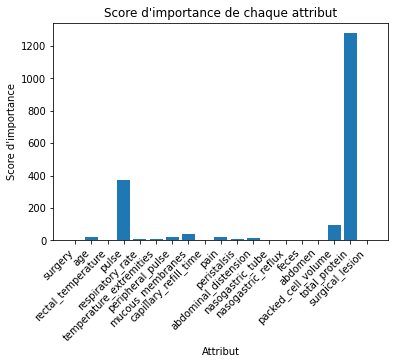

<Figure size 14400x5040 with 0 Axes>

In [72]:
generate_feature_importance_plot(total_scores)

Alors, je vois qu'avec mucous_membranes j'obtiens un score total de 42.94063 ce qui plus que deux fois le score de peripheral_pulse qui obtient 19.62360. Donc, la dernière feature que je choisirai est mucous_membranes. Je me retrouve avec les siz features suivantes : 'total_protein','pulse','packed_cell_volume', 'pain', 'abdominal_distension' et 'mucous_membranes'.

## 8) On recommence le tout

In [73]:
important_features = ['total_protein','pulse','packed_cell_volume', 'pain', 'abdominal_distension' ,'mucous_membranes', 'outcome']

In [74]:
new_train_df = df_train_drop[important_features]
new_test_df = df_test_drop[important_features]

In [75]:
new_train_df

,total_protein,pulse,packed_cell_volume,pain,abdominal_distension,mucous_membranes,outcome
0,8.4,66.0,45.0,5.0,4.0,NaN,2.0
1,85.0,88.0,50.0,3.0,2.0,4.0,3.0
2,6.7,40.0,33.0,3.0,1.0,3.0,1.0
3,7.2,164.0,48.0,2.0,4.0,6.0,2.0
4,7.4,104.0,74.0,NaN,NaN,6.0,2.0
...,...,...,...,...,...,...,...
295,65.0,120.0,55.0,2.0,NaN,4.0,3.0
296,NaN,72.0,44.0,4.0,3.0,4.0,3.0
297,6.8,72.0,60.0,4.0,3.0,4.0,2.0
298,6.0,100.0,50.0,3.0,3.0,3.0,1.0


### Le traitement des données manquantes

In [76]:
new_treat = TreatMissing(new_train_df, new_test_df)

In [77]:
new_treat.train_dfs

[]

#### a) On laisse tomber toutes les valeurs manquantes: on retire du jeu de données toutes les lignes qui ont une valeur manquante

In [78]:
new_treat.apply_treatment()

In [79]:
new_treat.train_dfs[0]

,total_protein,pulse,packed_cell_volume,pain,abdominal_distension,mucous_membranes,outcome
1,85.0,88.0,50.0,3.0,2.0,4.0,3.0
2,6.7,40.0,33.0,3.0,1.0,3.0,1.0
3,7.2,164.0,48.0,2.0,4.0,6.0,2.0
6,7.0,48.0,37.0,3.0,3.0,1.0,1.0
8,6.2,80.0,38.0,4.0,4.0,3.0,3.0
...,...,...,...,...,...,...,...
291,6.5,80.0,54.0,2.0,3.0,3.0,2.0
292,6.9,66.0,35.0,4.0,3.0,2.0,2.0
294,67.0,40.0,37.0,2.0,1.0,1.0,1.0
297,6.8,72.0,60.0,4.0,3.0,4.0,2.0


#### b) On remplace les données manquantes par la moyenne de leur groupe

In [80]:
from sklearn.impute import SimpleImputer

imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
new_treat.apply_treatment(imputer=imp_mean)

#### c) On remplace les données manquantes par la médiane de leur groupe

In [81]:
imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
new_treat.apply_treatment(imputer=imp_median)

#### d) On utilise les voisins immédiats pour trouver la bonne valeur

In [82]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=2, weights="uniform")
new_treat.apply_treatment(imputer=imputer)

In [83]:
len(new_treat.train_dfs)

4

#### e) On utilise la régression linéaire pour trouver la bonne valeur

In [84]:
from sklearn.impute._iterative import IterativeImputer

lin_reg_imputer = IterativeImputer(estimator=LinearRegression(), random_state=seed)
new_treat.apply_treatment(imputer=lin_reg_imputer)

#### e) Ma technique: On remplace par le mode, soit la donnée la plus fréquente de la colonne

In [85]:
imp_mode = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
new_treat.apply_treatment(imputer=imp_mode)

### L'apprentissage automatique et analyse des résultats


### Séparation des attributs du target

In [86]:
train_data = []
test_data = []

for (train, test) in zip(new_treat.train_dfs, new_treat.test_dfs):
    y_train = train["outcome"]
    X_train = train.drop(["outcome"], axis=1)
    y_test = test["outcome"]
    X_test = test.drop(["outcome"], axis=1)
    train_data.append((X_train, y_train.astype(int)))
    test_data.append((X_test, y_test.astype(int)))

#### Naive Bayes

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.59      0.83      0.69        23
           2       0.89      0.38      0.53        21
           3       0.29      0.50      0.36         4

    accuracy                           0.60        48
   macro avg       0.59      0.57      0.53        48
weighted avg       0.70      0.60      0.59        48

Matrice de confusion: 


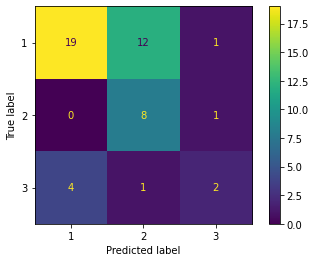

Courbes ROC


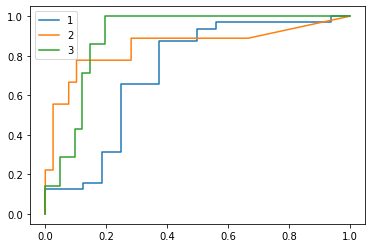

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.81      0.85      0.83        46
           2       0.67      0.50      0.57        16
           3       0.25      0.33      0.29         6

    accuracy                           0.72        68
   macro avg       0.58      0.56      0.56        68
weighted avg       0.73      0.72      0.72        68

Matrice de confusion: 


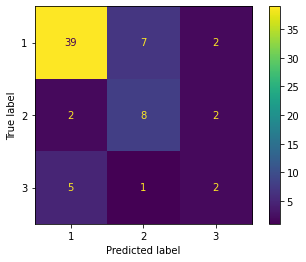

Courbes ROC


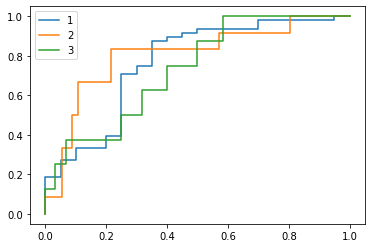

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.65      0.86      0.74        36
           2       0.92      0.41      0.56        27
           3       0.25      0.40      0.31         5

    accuracy                           0.65        68
   macro avg       0.60      0.56      0.54        68
weighted avg       0.72      0.65      0.64        68

Matrice de confusion: 


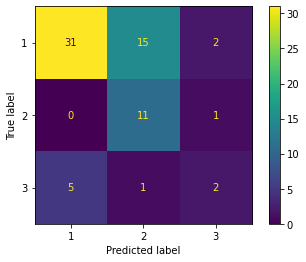

Courbes ROC


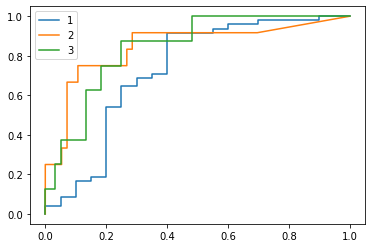

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.72      0.87      0.79        39
           2       0.92      0.48      0.63        25
           3       0.25      0.50      0.33         4

    accuracy                           0.71        68
   macro avg       0.63      0.62      0.59        68
weighted avg       0.77      0.71      0.71        68

Matrice de confusion: 


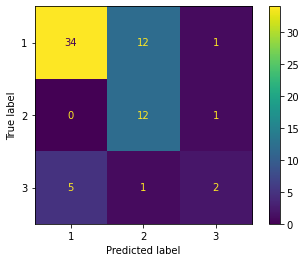

Courbes ROC


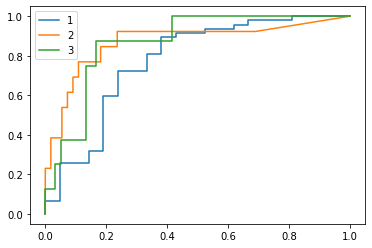

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.81      0.85      0.83        46
           2       0.75      0.53      0.62        17
           3       0.25      0.40      0.31         5

    accuracy                           0.74        68
   macro avg       0.60      0.59      0.59        68
weighted avg       0.76      0.74      0.74        68

Matrice de confusion: 


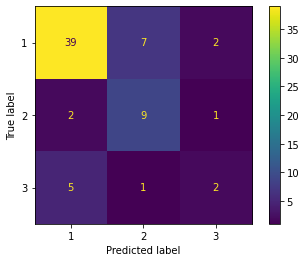

Courbes ROC


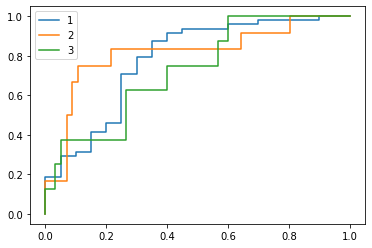

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.56      0.82      0.67        33
           2       0.83      0.36      0.50        28
           3       0.25      0.29      0.27         7

    accuracy                           0.57        68
   macro avg       0.55      0.49      0.48        68
weighted avg       0.64      0.57      0.56        68

Matrice de confusion: 


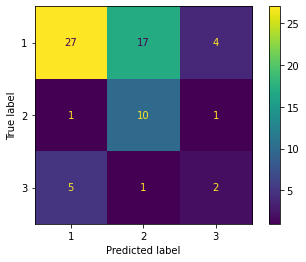

Courbes ROC


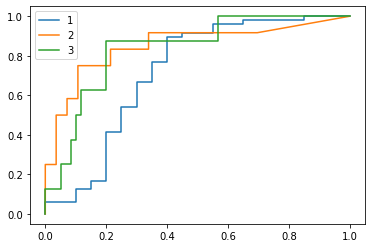

In [87]:
from sklearn.naive_bayes import GaussianNB

naive_bayes = MyAlgorithm(GaussianNB(), train_data, test_data)
naive_bayes.build_algorithm()
nb_accuracies = naive_bayes.get_accuracies()

#### Régression Logistique

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.91      0.78      0.84        37
           2       0.56      0.56      0.56         9
           3       0.14      0.50      0.22         2

    accuracy                           0.73        48
   macro avg       0.53      0.61      0.54        48
weighted avg       0.81      0.73      0.76        48

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


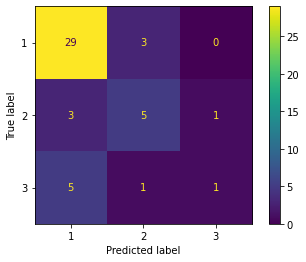

Courbes ROC


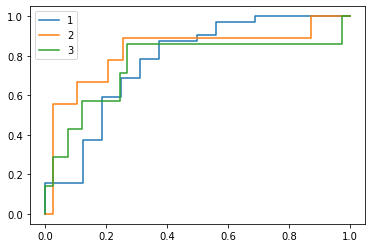

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.92      0.81      0.86        54
           2       0.58      0.58      0.58        12
           3       0.12      0.50      0.20         2

    accuracy                           0.76        68
   macro avg       0.54      0.63      0.55        68
weighted avg       0.83      0.76      0.79        68

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


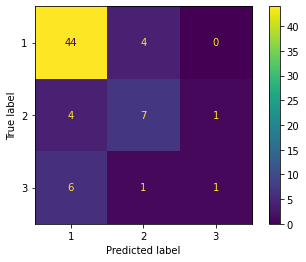

Courbes ROC


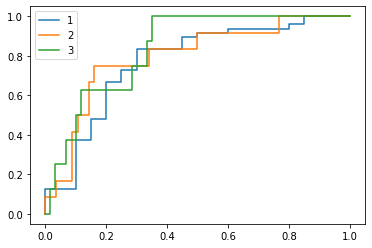

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.92      0.81      0.86        54
           2       0.58      0.64      0.61        11
           3       0.25      0.67      0.36         3

    accuracy                           0.78        68
   macro avg       0.58      0.71      0.61        68
weighted avg       0.83      0.78      0.80        68

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


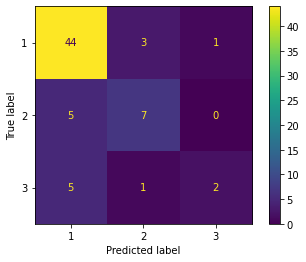

Courbes ROC


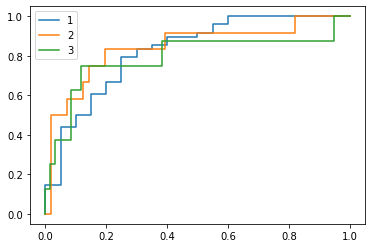

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.91      0.81      0.86        53
           2       0.69      0.64      0.67        14
           3       0.12      1.00      0.22         1

    accuracy                           0.78        68
   macro avg       0.58      0.82      0.58        68
weighted avg       0.86      0.78      0.81        68

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


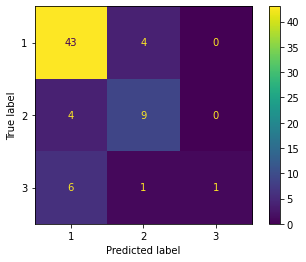

Courbes ROC


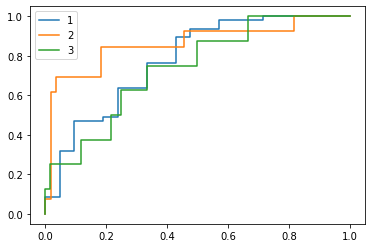

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.81      0.84        52
           2       0.58      0.54      0.56        13
           3       0.12      0.33      0.18         3

    accuracy                           0.74        68
   macro avg       0.53      0.56      0.53        68
weighted avg       0.79      0.74      0.76        68

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


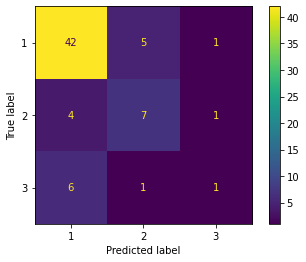

Courbes ROC


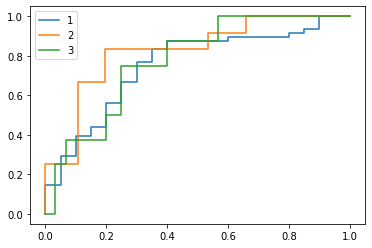

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.88      0.82      0.85        51
           2       0.67      0.53      0.59        15
           3       0.12      0.50      0.20         2

    accuracy                           0.75        68
   macro avg       0.56      0.62      0.55        68
weighted avg       0.81      0.75      0.77        68

Matrice de confusion: 


C:\Users\JadEl-Asmar\Anaconda3\envs\mypython3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


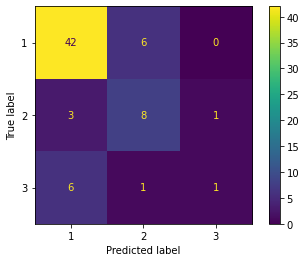

Courbes ROC


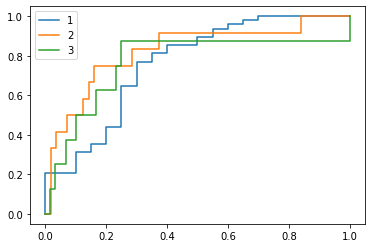

In [88]:
from sklearn.linear_model import LogisticRegression

logistic_regression = MyAlgorithm(LogisticRegression(random_state=seed) , train_data, test_data)
logistic_regression.build_algorithm()
lg_accuracies = logistic_regression.get_accuracies()

#### Decision Tree

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.59      0.76      0.67        25
           2       0.78      0.39      0.52        18
           3       0.29      0.40      0.33         5

    accuracy                           0.58        48
   macro avg       0.55      0.52      0.51        48
weighted avg       0.63      0.58      0.58        48

Matrice de confusion: 


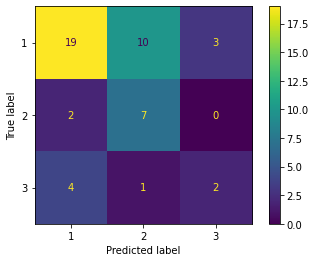

Courbes ROC


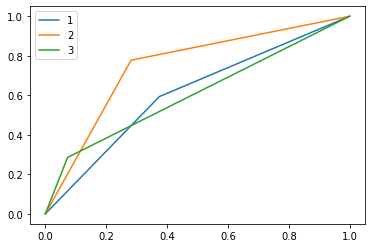

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.75      0.86      0.80        42
           2       0.58      0.37      0.45        19
           3       0.50      0.57      0.53         7

    accuracy                           0.69        68
   macro avg       0.61      0.60      0.59        68
weighted avg       0.68      0.69      0.68        68

Matrice de confusion: 


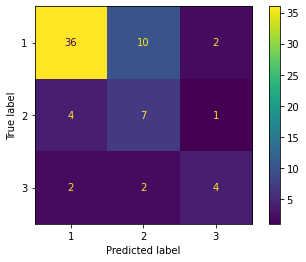

Courbes ROC


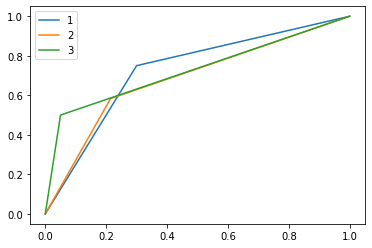

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.71      0.77      0.74        44
           2       0.58      0.39      0.47        18
           3       0.25      0.33      0.29         6

    accuracy                           0.63        68
   macro avg       0.51      0.50      0.50        68
weighted avg       0.63      0.63      0.63        68

Matrice de confusion: 


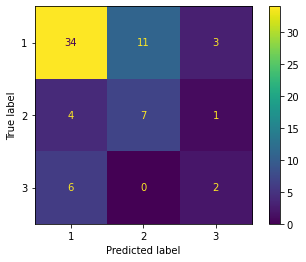

Courbes ROC


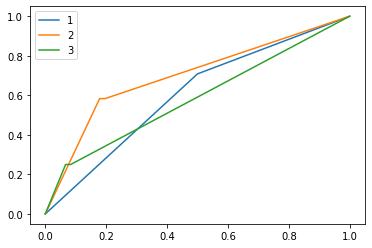

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.81      0.78      0.79        49
           2       0.62      0.44      0.52        18
           3       0.12      1.00      0.22         1

    accuracy                           0.69        68
   macro avg       0.52      0.74      0.51        68
weighted avg       0.75      0.69      0.71        68

Matrice de confusion: 


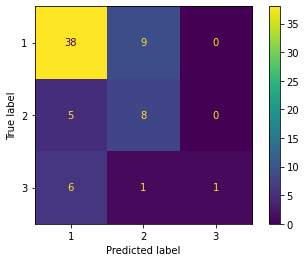

Courbes ROC


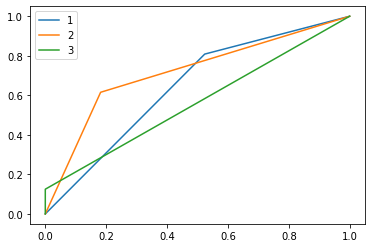

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.75      0.84      0.79        43
           2       0.67      0.42      0.52        19
           3       0.50      0.67      0.57         6

    accuracy                           0.71        68
   macro avg       0.64      0.64      0.63        68
weighted avg       0.70      0.71      0.69        68

Matrice de confusion: 


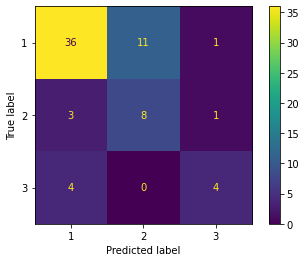

Courbes ROC


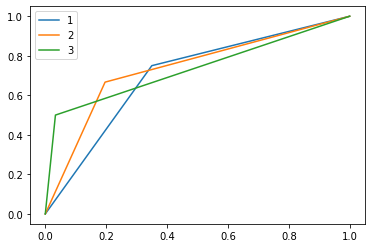

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.77      0.80      0.79        46
           2       0.58      0.41      0.48        17
           3       0.38      0.60      0.46         5

    accuracy                           0.69        68
   macro avg       0.58      0.61      0.58        68
weighted avg       0.69      0.69      0.69        68

Matrice de confusion: 


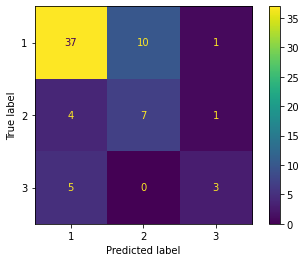

Courbes ROC


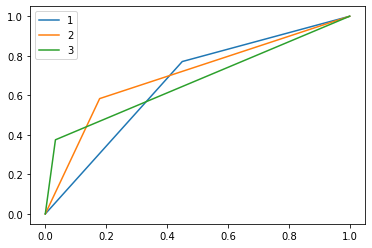

In [89]:
from sklearn.tree import DecisionTreeClassifier

decision_tree = MyAlgorithm(DecisionTreeClassifier(random_state=seed) , train_data, test_data)
decision_tree.build_algorithm()
decision_tree_accuracies = decision_tree.get_accuracies()

#### KNN

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.78      0.81      0.79        31
           2       0.89      0.53      0.67        15
           3       0.14      0.50      0.22         2

    accuracy                           0.71        48
   macro avg       0.60      0.61      0.56        48
weighted avg       0.79      0.71      0.73        48

Matrice de confusion: 


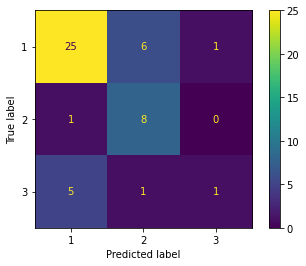

Courbes ROC


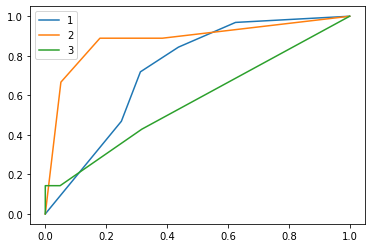

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.81      0.83      0.82        47
           2       0.75      0.50      0.60        18
           3       0.12      0.33      0.18         3

    accuracy                           0.72        68
   macro avg       0.56      0.55      0.53        68
weighted avg       0.77      0.72      0.73        68

Matrice de confusion: 


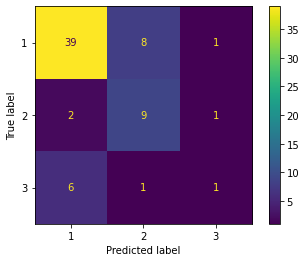

Courbes ROC


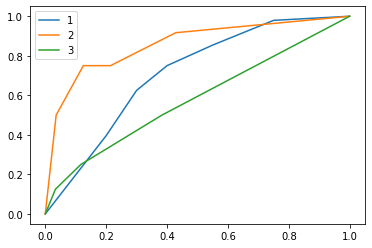

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.82      0.82        49
           2       0.75      0.53      0.62        17
           3       0.12      0.50      0.20         2

    accuracy                           0.74        68
   macro avg       0.57      0.62      0.55        68
weighted avg       0.79      0.74      0.76        68

Matrice de confusion: 


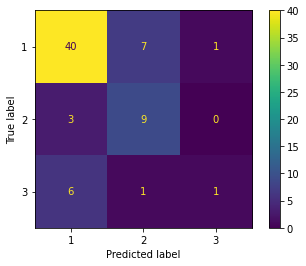

Courbes ROC


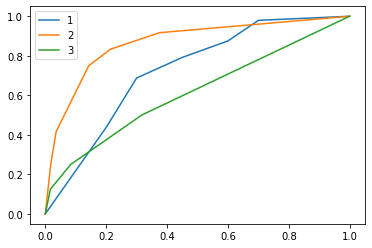

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.81      0.83      0.82        46
           2       0.85      0.55      0.67        20
           3       0.12      0.50      0.20         2

    accuracy                           0.74        68
   macro avg       0.59      0.63      0.56        68
weighted avg       0.80      0.74      0.75        68

Matrice de confusion: 


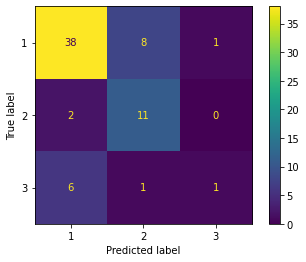

Courbes ROC


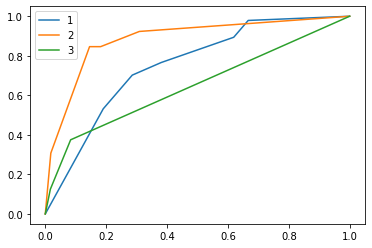

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.81      0.81      0.81        48
           2       0.75      0.50      0.60        18
           3       0.12      0.50      0.20         2

    accuracy                           0.72        68
   macro avg       0.56      0.60      0.54        68
weighted avg       0.78      0.72      0.74        68

Matrice de confusion: 


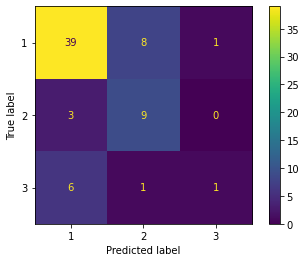

Courbes ROC


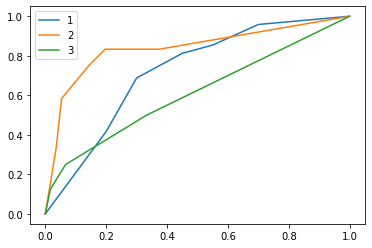

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.80      0.83        51
           2       0.67      0.53      0.59        15
           3       0.12      0.50      0.20         2

    accuracy                           0.74        68
   macro avg       0.55      0.61      0.54        68
weighted avg       0.79      0.74      0.76        68

Matrice de confusion: 


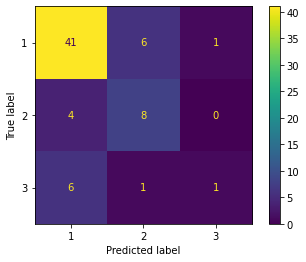

Courbes ROC


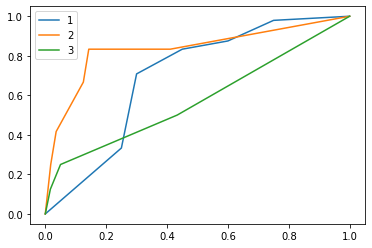

In [90]:
from sklearn.neighbors import KNeighborsClassifier

knn = MyAlgorithm(KNeighborsClassifier(), train_data, test_data)
knn.build_algorithm()
knn_accuracies = knn.get_accuracies()

#### Bagging (GBT)

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.69      0.85      0.76        26
           2       0.78      0.41      0.54        17
           3       0.43      0.60      0.50         5

    accuracy                           0.67        48
   macro avg       0.63      0.62      0.60        48
weighted avg       0.69      0.67      0.65        48

Matrice de confusion: 


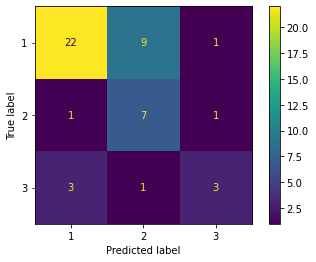

Courbes ROC


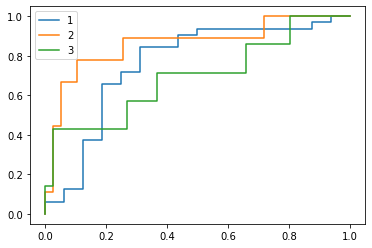

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.75      0.88      0.81        41
           2       0.67      0.42      0.52        19
           3       0.50      0.50      0.50         8

    accuracy                           0.71        68
   macro avg       0.64      0.60      0.61        68
weighted avg       0.70      0.71      0.69        68

Matrice de confusion: 


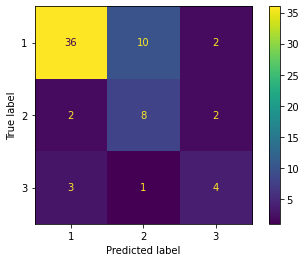

Courbes ROC


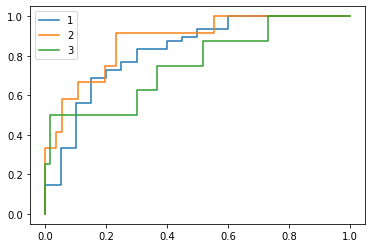

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.79      0.86      0.83        44
           2       0.75      0.50      0.60        18
           3       0.38      0.50      0.43         6

    accuracy                           0.74        68
   macro avg       0.64      0.62      0.62        68
weighted avg       0.74      0.74      0.73        68

Matrice de confusion: 


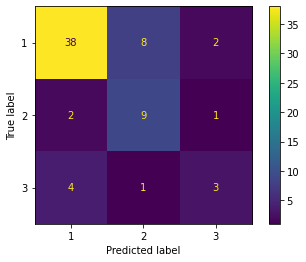

Courbes ROC


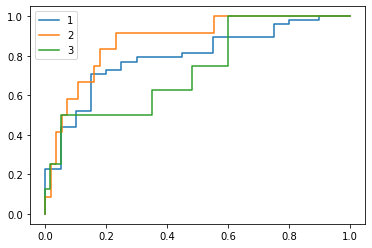

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.87      0.85        45
           2       0.85      0.58      0.69        19
           3       0.38      0.75      0.50         4

    accuracy                           0.78        68
   macro avg       0.68      0.73      0.68        68
weighted avg       0.81      0.78      0.78        68

Matrice de confusion: 


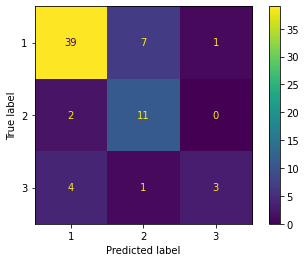

Courbes ROC


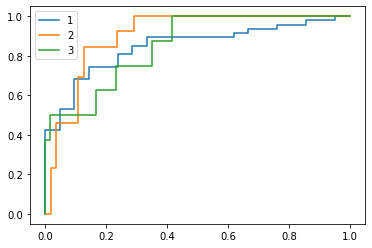

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.81      0.85      0.83        46
           2       0.75      0.50      0.60        18
           3       0.38      0.75      0.50         4

    accuracy                           0.75        68
   macro avg       0.65      0.70      0.64        68
weighted avg       0.77      0.75      0.75        68

Matrice de confusion: 


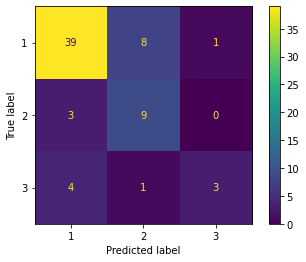

Courbes ROC


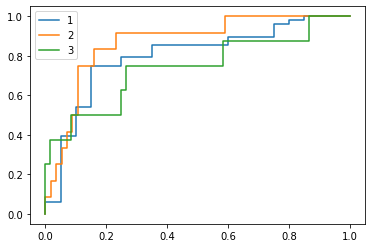

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.79      0.84      0.82        45
           2       0.67      0.42      0.52        19
           3       0.38      0.75      0.50         4

    accuracy                           0.72        68
   macro avg       0.61      0.67      0.61        68
weighted avg       0.73      0.72      0.71        68

Matrice de confusion: 


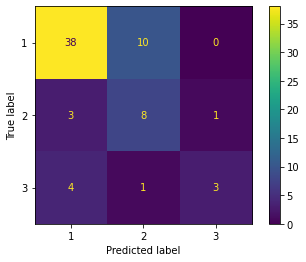

Courbes ROC


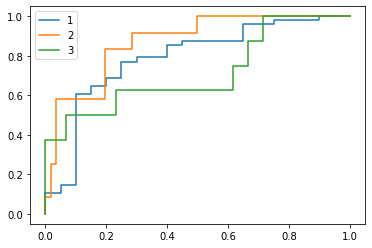

In [91]:
from sklearn.ensemble import GradientBoostingClassifier

gbt = MyAlgorithm(GradientBoostingClassifier(random_state=seed), train_data, test_data)
gbt.build_algorithm()
gbt_accuracies = gbt.get_accuracies()

#### Ada Boost (Naive Bayes)

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.84      0.79      0.82        34
           2       0.89      0.67      0.76        12
           3       0.00      0.00      0.00         2

    accuracy                           0.73        48
   macro avg       0.58      0.49      0.53        48
weighted avg       0.82      0.73      0.77        48

Matrice de confusion: 


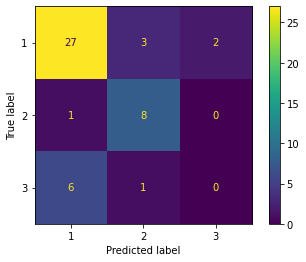

Courbes ROC


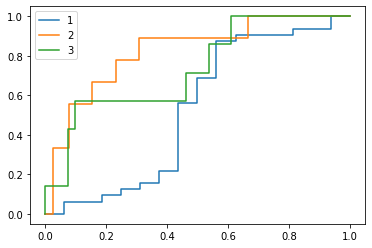

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.79      0.84      0.82        45
           2       0.83      0.56      0.67        18
           3       0.25      0.40      0.31         5

    accuracy                           0.74        68
   macro avg       0.62      0.60      0.60        68
weighted avg       0.76      0.74      0.74        68

Matrice de confusion: 


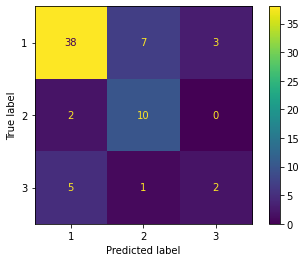

Courbes ROC


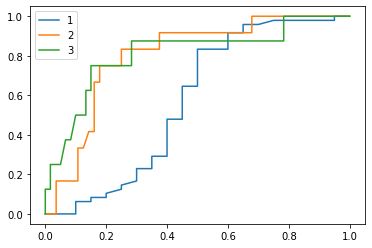

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.81      0.81      0.81        48
           2       0.83      0.53      0.65        19
           3       0.00      0.00      0.00         1

    accuracy                           0.72        68
   macro avg       0.55      0.45      0.49        68
weighted avg       0.81      0.72      0.75        68

Matrice de confusion: 


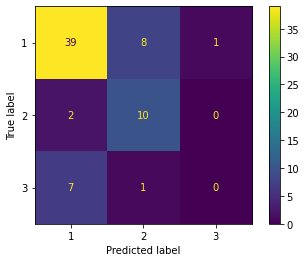

Courbes ROC


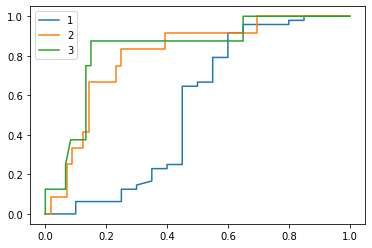

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.79      0.79      0.79        47
           2       0.77      0.50      0.61        20
           3       0.12      1.00      0.22         1

    accuracy                           0.71        68
   macro avg       0.56      0.76      0.54        68
weighted avg       0.77      0.71      0.73        68

Matrice de confusion: 


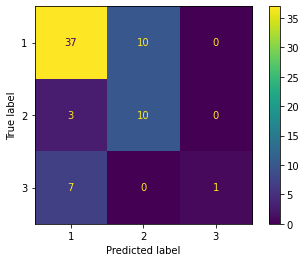

Courbes ROC


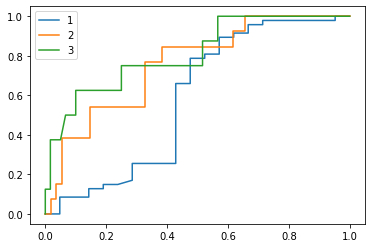

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.67      0.86      0.75        37
           2       0.83      0.62      0.71        16
           3       0.50      0.27      0.35        15

    accuracy                           0.68        68
   macro avg       0.67      0.59      0.61        68
weighted avg       0.67      0.68      0.65        68

Matrice de confusion: 


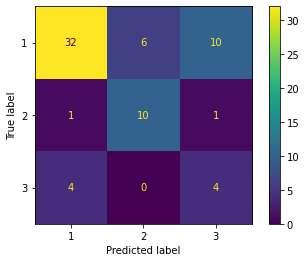

Courbes ROC


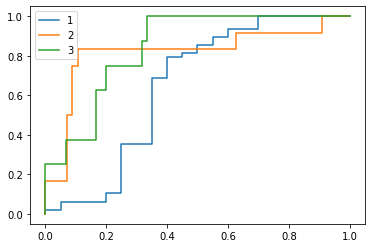

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.56      0.82      0.67        33
           2       0.75      0.43      0.55        21
           3       0.38      0.21      0.27        14

    accuracy                           0.57        68
   macro avg       0.56      0.49      0.49        68
weighted avg       0.58      0.57      0.55        68

Matrice de confusion: 


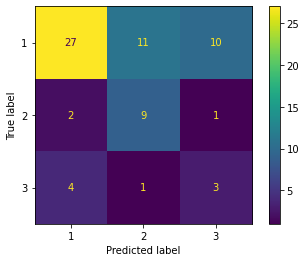

Courbes ROC


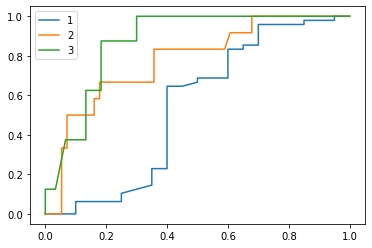

In [92]:
from sklearn.ensemble import AdaBoostClassifier

ada_boost = MyAlgorithm(AdaBoostClassifier(random_state=seed) , train_data, test_data)
ada_boost.build_algorithm()
ada_boost_accuracies = gbt.get_accuracies()

#### Random Forest

Drop NaN: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.72      0.79      0.75        29
           2       0.78      0.41      0.54        17
           3       0.29      1.00      0.44         2

    accuracy                           0.67        48
   macro avg       0.59      0.73      0.58        48
weighted avg       0.72      0.67      0.66        48

Matrice de confusion: 


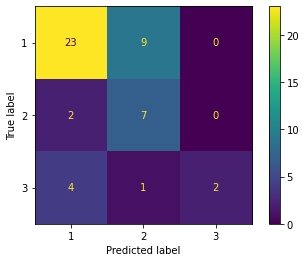

Courbes ROC


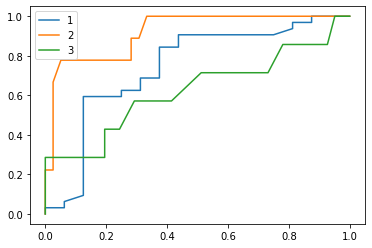

Mean: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.80      0.83        51
           2       0.58      0.47      0.52        15
           3       0.25      1.00      0.40         2

    accuracy                           0.74        68
   macro avg       0.56      0.76      0.58        68
weighted avg       0.78      0.74      0.75        68

Matrice de confusion: 


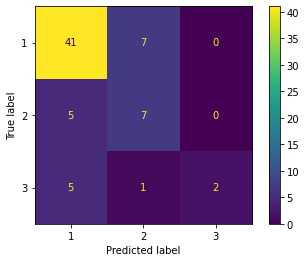

Courbes ROC


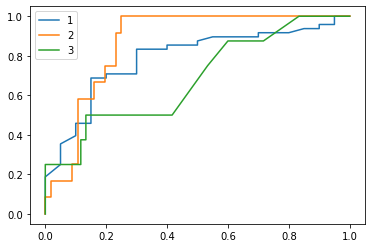

Median: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.82      0.84        50
           2       0.67      0.50      0.57        16
           3       0.25      1.00      0.40         2

    accuracy                           0.75        68
   macro avg       0.59      0.77      0.60        68
weighted avg       0.79      0.75      0.76        68

Matrice de confusion: 


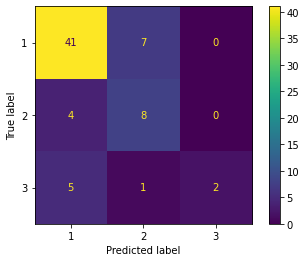

Courbes ROC


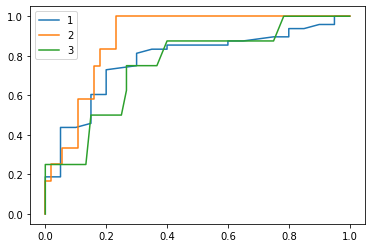

Neighbors: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.85      0.83      0.84        48
           2       0.77      0.56      0.65        18
           3       0.25      1.00      0.40         2

    accuracy                           0.76        68
   macro avg       0.62      0.80      0.63        68
weighted avg       0.81      0.76      0.78        68

Matrice de confusion: 


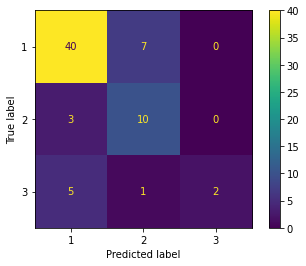

Courbes ROC


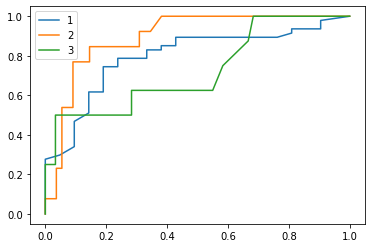

Linear Regression: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.79      0.83      0.81        46
           2       0.75      0.47      0.58        19
           3       0.25      0.67      0.36         3

    accuracy                           0.72        68
   macro avg       0.60      0.66      0.58        68
weighted avg       0.76      0.72      0.73        68

Matrice de confusion: 


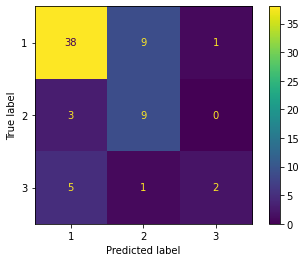

Courbes ROC


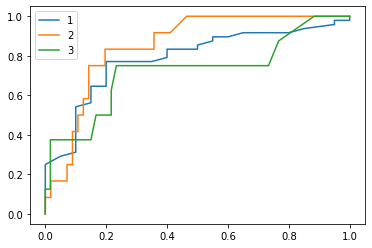

Mode: 
Rapport de classification: 
              precision    recall  f1-score   support

           1       0.83      0.80      0.82        50
           2       0.58      0.44      0.50        16
           3       0.25      1.00      0.40         2

    accuracy                           0.72        68
   macro avg       0.56      0.75      0.57        68
weighted avg       0.76      0.72      0.73        68

Matrice de confusion: 


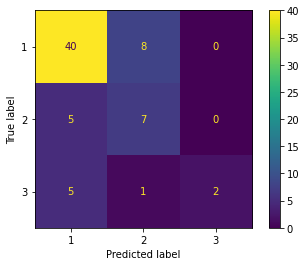

Courbes ROC


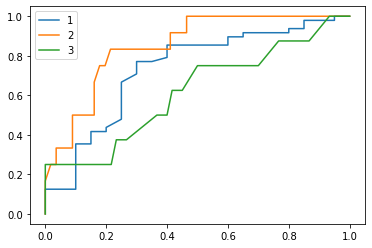

In [93]:
from sklearn.ensemble import RandomForestClassifier

random_forest = MyAlgorithm(RandomForestClassifier(random_state=seed), train_data, test_data)
random_forest.build_algorithm()
random_forest_accuracies = random_forest.get_accuracies()

In [94]:
new_all_accuracies = []

new_all_accuracies.append(nb_accuracies)
new_all_accuracies.append(lg_accuracies)
new_all_accuracies.append(decision_tree_accuracies)
new_all_accuracies.append(knn_accuracies)
new_all_accuracies.append(gbt_accuracies)
new_all_accuracies.append(ada_boost_accuracies)
new_all_accuracies.append(random_forest_accuracies)

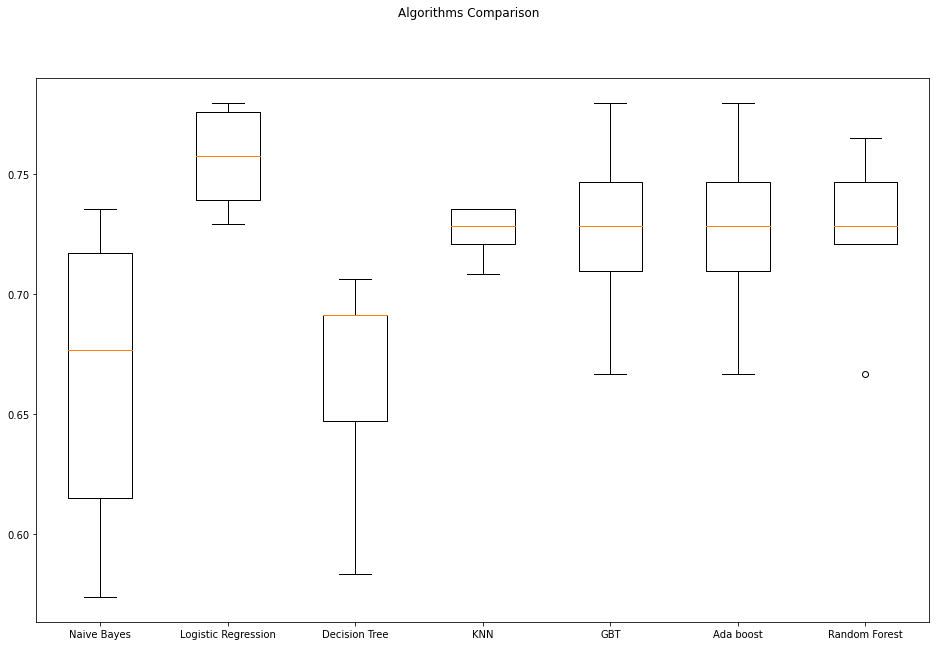

In [95]:
names = ["Naive Bayes", "Logistic Regression", "Decision Tree", "KNN", "GBT", "Ada boost", "Random Forest"]
fig = plt.figure(figsize=(16,10))
fig.suptitle('Algorithms Comparison')
ax = fig.add_subplot(111)
plt.boxplot(new_all_accuracies)
ax.set_xticklabels(names)
plt.show()

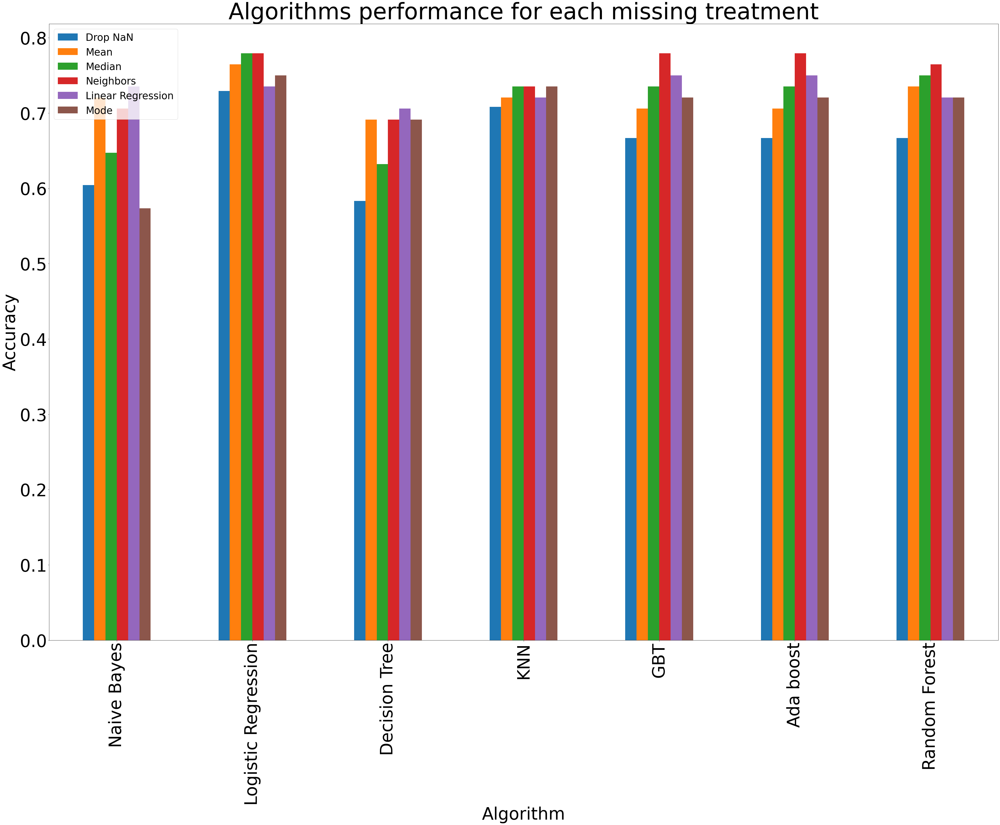

In [96]:
drop_nan_list = []
mean_list = []
median_list = []
neighbors_list = []
linear_reg_list = [] 
mode_list = []

for data in new_all_accuracies:
    drop_nan_list.append(data[0])
    mean_list.append(data[1])
    median_list.append(data[2])
    neighbors_list.append(data[3])
    linear_reg_list.append(data[4])
    mode_list.append(data[5])
    
plotdata = pd.DataFrame({
    "Drop NaN": drop_nan_list,
    "Mean": mean_list,
    "Median": median_list,
    "Neighbors": neighbors_list,
    "Linear Regression": linear_reg_list,
    "Mode": mode_list
    }, 
    index=["Naive Bayes", "Logistic Regression", "Decision Tree", "KNN", "GBT", "Ada boost", "Random Forest"]
)
my_plot = plotdata.plot(kind="bar", figsize=(60,40), fontsize=60)
plt.title("Algorithms performance for each missing treatment", fontsize=80)
plt.xlabel("Algorithm", fontsize=60)
plt.ylabel("Accuracy", fontsize=60)
my_plot.legend(fontsize=35)

In [97]:
plotdata

,Drop NaN,Mean,Median,Neighbors,Linear Regression,Mode
Naive Bayes,0.604167,0.720588,0.647059,0.705882,0.735294,0.573529
Logistic Regression,0.729167,0.764706,0.779412,0.779412,0.735294,0.750000
Decision Tree,0.583333,0.691176,0.632353,0.691176,0.705882,0.691176
KNN,0.708333,0.720588,0.735294,0.735294,0.720588,0.735294
GBT,0.666667,0.705882,0.735294,0.779412,0.750000,0.720588
Ada boost,0.666667,0.705882,0.735294,0.779412,0.750000,0.720588
Random Forest,0.666667,0.735294,0.750000,0.764706,0.720588,0.720588


## 9) et les gagnants sont … 

Je peux voir que les résultats pour GBT et Ada Boost se sont améliorés (algorithmes ensemblistes) puisque j'ai effectué l'extraction de features importantes sur mon algorithme de Random Forest qui est aussi un algorithme ensembliste. On peut voir aussi quelques plus faibles résultats pour le Random Forest puisque ce ne sont pas les six features les plus importantes pour lui qui ont été prises en compte. En effet, la feature rectal_temperature n'a pas été prise en compte. Si cette feature avait été prise, j'aurai probablement obtenu de meilleurs résultats pour mon algorithme de Random Forest. On observe aussi, une amélioration des résultats pour ma régression logistique puisqu'il y a probablement une dépendance entre les features choisies. Mon algorithme d'arbre de décision s'est aussi amélioré. Pour KNN et Naive Bayes, les changements ne sont pas majeurs, on aperçoit quelques améliorations et quelques détériorations. Le grand gagnant serait la régression logistique comme nous pouvons le voir dans les nouvelles boîtes à moustaches générées. 

## 10) À vous le mot de la fin 

Ce projet m'a permis d'explorer une grande partie des techniques apprises dans ce cours. Après avoir effectué mon problème de classement sur la variable outcome, je voulais aller plus loin, alors j'ai décidé de faire le problème de classification sur la variable surgical_lesion qui est une variable binaire. J'ai vraiment apprécié faire partie de votre cours et je vous remercie pour cette session ! Toutes ces connaissances me seront utiles dans ma carrière, je vous souhaite de passer de merveilleuses vacances !